In [71]:
import os
import pandas as pd
import numpy as np
from os import listdir
from os.path import isfile, join
from pathlib import Path
import matplotlib.pyplot as plt
import datetime
from scipy import stats

In [72]:
DSDATA = Path(os.getenv('DSDATA'))
print(DSDATA)

/Users/macbookpro/Desktop/DLSU/9th_Term/DATASCI/DSDATA


In [73]:
folder = DSDATA / 'RETAIL_PRICES' #for crops
mfolder = DSDATA / 'MEATS' #for MEAT
geofolder = DSDATA / 'FOOD_BY_GEO'# unprocessed data
proc_national = DSDATA / 'P_NATIONAL'# processed data
half_folder = DSDATA / 'HALF_PROC' # half processed
cpifolder = DSDATA / 'CPI'

In [74]:
#make folder if none was created
def makefolder(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)
        
#remove DSstore
def remove_DS_STORE(filenamess):
    try:
        filenamess.remove('.DS_Store')
    except ValueError: 
        print("No .DS_Store")
    return filenamess

# List Directory:
    national_f: list of processed files
    unprocessed: list of unprocessed files
    half_files: list of half processed files

In [75]:
national_f = []
unprocessed = []
half_files = [f for f in listdir(half_folder) if isfile(join(half_folder, f))]

geofiles = [f for f in listdir(geofolder) if isfile(join(geofolder, f))]
geofiles = remove_DS_STORE(geofiles)
for x in geofiles:
    if '_CPI' in x and x != '.DS_Store':
        national_f.append(x)

for x in geofiles:
    if '_mean' not in x and 'national' in x:
        unprocessed.append(x)


national_f = [f for f in listdir(proc_national) if isfile(join(proc_national, f))]
national_f = remove_DS_STORE(national_f)


No .DS_Store
No .DS_Store


In [76]:
national_f

['CROPSCPI.csv', 'POULTRYCPI.csv', 'BeefCPI.csv', 'SEAFOODCPI.csv']

# Null Hypothesis
- The null hypothesis (H0) assumes that the difference between the average prices today (μ) and the mean of the prices before(1,5,10,20 year/s) is equal to zero.
- The two-tailed alternative hypothesis (H1) assumes that the difference between the average prices today (μ) and the mean of the prices before(1,5,10,20 year/s) (m0) is not equal to zero.

# Conclusions

   - 1 Year ago 
        - Reject null hypothesis 
        - The  difference between average prices today (μ) and the mean of the prices before 1 (m0) is not equal to zero.
   - 5 Years ago 
       - **ACCEPTED**
           - Pork and Beef(40%)
               - Pork Lean Meat 
               - Pork Meat with bones 
           - Crops (55%)
               - Gabi Cebu  
               - for ginataan [Taro (cocoyam)] 
               - Sweet Potato
               - White/Irish Potato 
               - Ampalaya [Bitter gourd]
               - Chayote
               -  Squash 
               - Upo [Bottle gourd]
               - Cabbage
               - Pechay native
               - Habitchuelas [Snap beans]
               - Ginger Hawaiian  
               - Onion Red Creole (Bermuda red) 
               - Onion White (Yellow granex)    
               - Corngrain Yellow    
               - Corngrits Yellow    
               - Corngrits White    
               - Banana Lakatan  ripe* 
               -  Banana Saba  ripe*    
               - Mandarin Szinkom    
               - Mango Carabao  ripe    
               - Mango Piko  ripe    
               - Papaya Hawaiian*
            - Seafood(8.33%)
                - Tilapia
            - Poultry (25%)
                - Duck egg
            - # conclusion : The difference between average prices today (μ) and the mean of the prices before 1 (m0) is equal to zero.

   - 10 Years ago 
       - **ACCEPTED**
           - Pork and Beef(40%)
               - Pork Lean Meat 
               - Pork Meat with bones 
           - Crops (27.5%)
               - Cabbage
               - Peanut with shell, dry
               - Peanut without shell, dry
               - Rice Special
               - Rice Premium
               - Well Milled Rice (WMR)
               - Regular Milled Rice (RMR)
               - Habitchuelas [Snap beans]
               - Ginger Hawaiian     
               - Corngrain Yellow    
               - Corngrits Yellow    
               - Corngrits White       
               - Mandarin Szinkom    
            - Poultry (25%)
                - Duck egg
            - # conclusion : The difference between average prices today (μ) and the mean of the prices before 1 (m0) is equal to zero.
   - 20 Years ago 
        - **ACCEPTED**
           - Pork and Beef(20%)
               - Pork Meat with bones 
           - Crops (25.5%)
               - Cabbage
               - Peanut with shell, dry
               - Peanut without shell, dry
               - Rice Special
               - Rice Premium
               - Well Milled Rice (WMR)
               - Regular Milled Rice (RMR)
               - Habitchuelas [Snap beans]
               - Ginger Hawaiian     
               - Corngrain Yellow    
               - Corngrits Yellow    
               - Corngrits White       
               - Mandarin Szinkom 
               - Papaya Hawaiian
            - Poultry (25%)
                - Duck egg
            - Seafood(16%)
                - Shrimp, Sugpo [Tiger prawn]
                - Tilapia'
            - # conclusion : The difference between average prices today (μ) and the mean of the prices before 1 (m0) is equal to zero.


## The rest that was not specified, the output is to reject the null hypothesis, conclusion: - The  difference between average prices today (μ) and the mean of the prices before 1 (m0) is not equal to zero.


In [77]:
# taken from prices2012.csv 
# anual cpi from 1992 till 2018
annual_cpi = [25.0,29.9,32.4,34.6,38.9,41.6,45.1,47.6,52.1,55.3,58.9,62.1,63.8,
65.2,68.4,72.9,76.9,79.1,85.6,89.2,92.6,97.0,100.0,102.6,106.3,107.0,108.4,111.5,117.3]
current_cpi = 119.8 # as of May 2019
anual_mult = []
for x in annual_cpi:
    anual_mult.append(current_cpi/x)

In [78]:
anual_mult

[4.792,
 4.006688963210703,
 3.697530864197531,
 3.4624277456647397,
 3.0796915167095116,
 2.879807692307692,
 2.656319290465632,
 2.5168067226890756,
 2.2994241842610363,
 2.166365280289331,
 2.033955857385399,
 1.92914653784219,
 1.877742946708464,
 1.8374233128834354,
 1.7514619883040934,
 1.643347050754458,
 1.5578673602080622,
 1.5145385587863465,
 1.3995327102803738,
 1.34304932735426,
 1.2937365010799136,
 1.2350515463917526,
 1.198,
 1.1676413255360625,
 1.1269990592662276,
 1.119626168224299,
 1.1051660516605166,
 1.074439461883408,
 1.0213128729752772]

In [79]:
def one_sample(data, data_cpi ,year):
    reject_th0 = []
    accept_th0 = []
    # go through all the rows
    years = year * -1
    data_filtered = data.filter(regex='Annual')
    ctr=0
    # multiply annual prices to theur corresponding cpi
    for x in data_filtered.columns:
        data_filtered[x] = data_filtered[x].multiply(anual_mult[ctr])
        ctr= ctr+1
    for x in range(data.shape[0]):
        #average of the current year
        known_mean = data_cpi.iloc[x,-5:].mean()
        #dataframe that has the anual table
        sample = data_filtered.iloc[x,years:]
        one_sample = stats.ttest_1samp(sample, known_mean)
        if one_sample.pvalue >0.05 :
            accept_th0.append(data.loc[x,'Commodity'])
        else:
            reject_th0.append(data.loc[x,'Commodity'])
    print('REJECT')
    print(reject_th0)
    print(len(reject_th0)/data.shape[0])
    print('ACCEPT')
    print(accept_th0)
    print(len(accept_th0)/data.shape[0])
    #return reject_th0,accept_th0

# One sample t-test for unprocessed data

In [80]:
years = [1,5,10,20]
for year in years:
    print('year '+ str(year) + "----------------------")
    for file in unprocessed:
        national = pd.read_csv(DSDATA / 'FOOD_BY_GEO' / file , encoding = "ISO-8859-1")
        new_file= file.split('.')[0]+"_HALF.csv"
        national_cpi = pd.read_csv(DSDATA / 'HALF_PROC' / new_file , encoding = "ISO-8859-1")
        one_sample(national,national_cpi ,year)

year 1----------------------
REJECT
['Beef Lean Meat', 'Beef Meat with bones', 'Pork Lean Meat', 'Pork Meat with bones', 'Pork Pata (front)']
1.0
ACCEPT
[]
0.0


/Users/macbookpro/Desktop/DLSU/9th_Term/DATASCI/venv/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/Users/macbookpro/Desktop/DLSU/9th_Term/DATASCI/venv/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3506: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/Users/macbookpro/Desktop/DLSU/9th_Term/DATASCI/venv/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


REJECT
['Carrots', 'Gabi Cebu, for ginataan [Taro (cocoyam)]', 'Sweet Potato', 'White/Irish Potato', 'Ampalaya [Bitter gourd]', 'Chayote', 'Eggplant long, purple', 'Squash', 'Tomato', 'Upo [Bottle gourd]', 'Cabbage', 'Camote tops [Sweet potato tops]', 'Kangkong [Morning glory]', 'Pechay native', 'Habitchuelas [Snap beans]', 'Mongo [Mungbean], green', 'Peanut with shell, dry', 'Peanut without shell, dry', 'Stringbeans', 'Garlic', 'Ginger Hawaiian', 'Onion Red Creole (Bermuda red)', 'Onion White (Yellow granex)', 'Rice Special', 'Rice Premium', 'Well Milled Rice (WMR)', 'Regular Milled Rice (RMR)', 'Corngrain Yellow', 'Corngrain White', 'Corngrits Yellow', 'Corngrits White', 'Banana Lakatan, ripe*', 'Banana Latundan, ripe*', 'Banana Saba, ripe*', 'Calamansi', 'Mandarin Szinkom', 'Mango Carabao, ripe', 'Mango Piko, ripe', 'Papaya Hawaiian*', 'Pineapple Hawaiian*']
1.0
ACCEPT
[]
0.0
REJECT
['Alumahan [Indian mackerel]', 'Bangus [Milkfish]', 'Bisugo [Threadfin bream]', 'Crab, Alimasag [Blue

# Stationary 
- Time series are stationary if they do not have trend or seasonal effects. Summary statistics calculated on the time series are consistent over time, like the mean or the variance of the observations.
- When a time series is stationary, it can be easier to model. Statistical modeling methods assume or require the time series to be stationary to be effective.
    - **STATIONARY**:
    ## An example of a graph stationary data 
    ![alt text](https://3qeqpr26caki16dnhd19sv6by6v-wpengine.netdna-ssl.com/wp-content/uploads/2016/12/Daily-Female-Births-Dataset-Plot.png)
    ## An example of distribution stationary data 
    ![alt text](https://3qeqpr26caki16dnhd19sv6by6v-wpengine.netdna-ssl.com/wp-content/uploads/2016/12/Histogram-of-Daily-Female-Births.png)
     source: https://machinelearningmastery.com/time-series-data-stationary-python/
        - Carrots 
        - White/Irish Potato
        - Chayote 
        - Eggplant long purple
        - Squash
        - Tomato
        - Cabbage
        - Habitchuelas [Snap beans]
        - Peanut with shell, dry
        - Stringbeans', 'Ginger Hawaiian
        - Onion Red Creole (Bermuda red)
        - Onion White (Yellow granex)
        - Rice Special
        - Regular Milled Rice (RMR)
        - Corngrain Yellow
        - Corngrain White
        - Corngrits Yellow 
        - Corngrits White
        - Calamansi 
        - Chicken Broiler (live) 
        - Chicken egg (other breed)
        - Duck egg
        - Beef Meat with bones
    - **NOT STATIONARY**
        - Gabi Cebu, for ginataan Taro (cocoyam)
        - Sweet Potato
        - Ampalaya [Bitter gourd]
        - Upo [Bottle gourd]
        - Camote tops [Sweet potato tops]-
        - Kangkong [Morning glory]
        - Pechay native
        - Mongo [Mungbean] green
        - Peanut without shell, dry
        - Garlic
        - Rice Premium
        - Well Milled Rice (WMR)
        - Banana Lakatan, ripe
        - Banana Latundan, ripe
        - Banana Saba, ripe
        - Mandarin Szinkom
        - Mango Carabao, ripe
        - Mango Piko, ripe
        - Papaya Hawaiian
        - Pineapple Hawaiian
        - Chicken Fully Dressed (broiler)
        - Beef Lean Meat
        - Pork Lean Meat
        - Pork Meat with bones
        - Pork Pata (front)
        - Alumahan [Indian mackerel]
        - Bangus [Milkfish]
        - Bisugo [Threadfin bream]
        - Crab, Alimasag [Blue crab]
        - Dalagang-Bukid, lapad [Caesio]
        - Dilis [Anchovies]
        - Galunggong [Roundscad]
        - Sapsap [Slipmouth]
        - Shrimp, Suaje [Endeavor prawn]
        - Shrimp, Sugpo [Tiger prawn]
        - Tilapia
        - Tulingan [Frigate tuna
- source : https://machinelearningmastery.com/time-series-data-stationary-python/

In [81]:
def test_stationarity(timeseries):
    adftest = adfuller(timeseries)
    output = True
    if (adftest[0] > adftest[4]['5%']):
        print("{} \t | The series is not stationary".format(timeseries.name))
        output = False
    else:
        print("{} \t | The series is stationary".format(timeseries.name))
    return output

# Processed Visualizations
- cpi was multiplied to the prices
- the mean was filled with the mean
- Output: Histogram and Line graph(x-axis:years y-axis:prices)

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 August,2018 September,2018 October,2018 November,2018 December,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Carrots,107.191321,88.520374,92.569766,101.802097,128.706866,165.327919,202.139642,183.589458,...,94.716875,125.373958,102.72,85.312425,76.474516,68.560605,61.717586,63.575339,76.217241,78.06
1,PHILIPPINES,"Gabi Cebu, for ginataan [Taro (cocoyam)]",39.568278,40.563512,42.077166,110.483805,109.788938,49.039999,51.969203,57.801993,...,46.311199,46.777138,46.38,46.527676,45.965315,47.749001,48.090712,46.684845,49.312324,49.72
2,PHILIPPINES,Sweet Potato,18.401512,18.932969,25.545073,27.522079,27.643059,29.375445,32.988731,35.666077,...,45.258902,45.493925,43.50,42.841522,42.952683,42.779966,40.278106,38.139179,39.325652,41.06
3,PHILIPPINES,White/Irish Potato,97.990565,83.774642,84.204128,53.761766,79.008175,82.494019,96.527895,101.834777,...,70.331909,74.767230,76.74,88.327458,81.421682,75.189337,69.168684,67.903403,70.677993,72.66
4,PHILIPPINES,Ampalaya [Bitter gourd],64.807510,58.996931,52.733396,54.057703,56.658468,63.557781,67.555183,52.112633,...,85.964595,78.837423,76.24,75.996873,70.419024,83.980705,77.232339,71.940251,74.905050,72.45
5,PHILIPPINES,Chayote,30.518354,33.020297,34.458461,32.651642,36.416299,40.931405,42.024774,34.136165,...,38.803463,57.012770,48.32,38.133662,34.428646,37.478992,36.924107,30.678039,35.048512,37.83
6,PHILIPPINES,"Eggplant long, purple",54.852594,48.256592,44.766121,45.475549,45.973740,44.961425,55.124647,48.909379,...,64.169899,62.225824,56.46,59.889983,55.617830,66.860672,54.537619,53.422967,56.644565,54.95
7,PHILIPPINES,Squash,36.501360,35.268275,33.113983,33.736742,34.553824,35.201980,39.729906,39.873335,...,43.316199,37.604167,31.97,29.549331,29.300118,29.150327,29.774267,29.603554,36.470886,38.51
8,PHILIPPINES,Tomato,46.506553,32.670612,32.018483,33.638096,41.660638,63.509227,61.674583,49.148428,...,68.409443,62.727079,45.01,50.584448,52.353305,46.612359,45.550109,38.721609,38.694599,56.52
9,PHILIPPINES,Upo [Bottle gourd],28.959756,25.626948,25.395686,25.943752,28.035159,29.132673,33.658067,29.163950,...,37.518446,36.361054,32.86,31.422458,30.811472,31.936608,31.350847,30.778458,32.354013,32.26


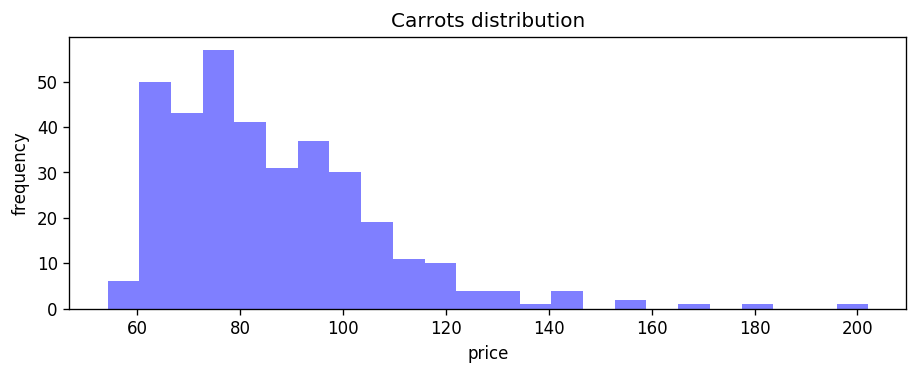

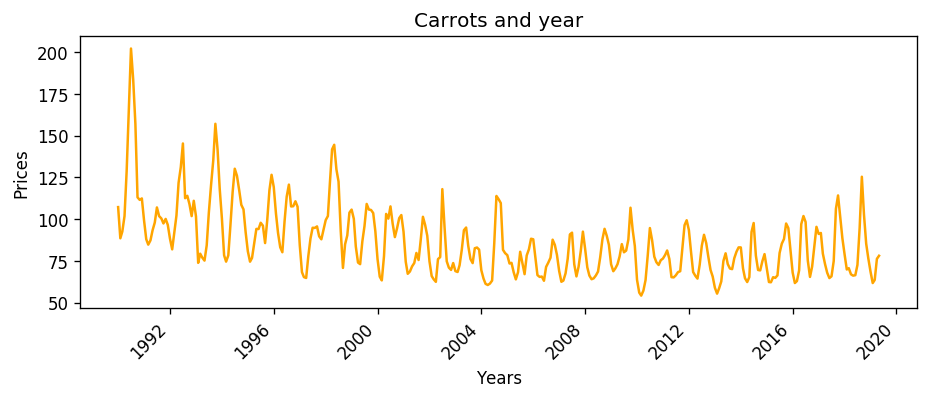

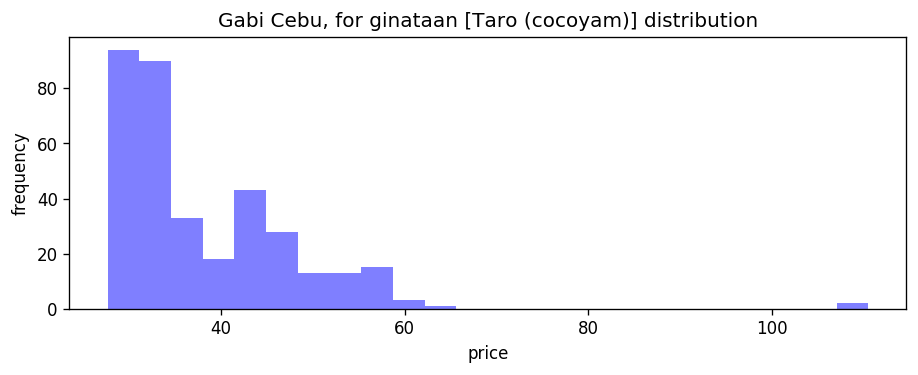

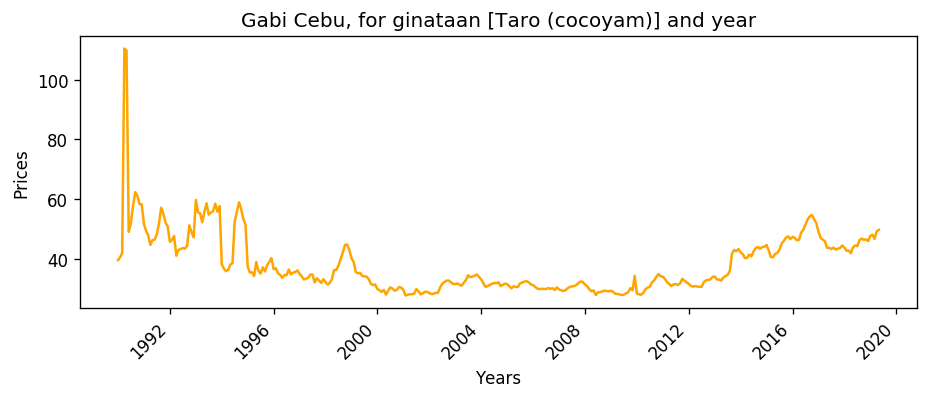

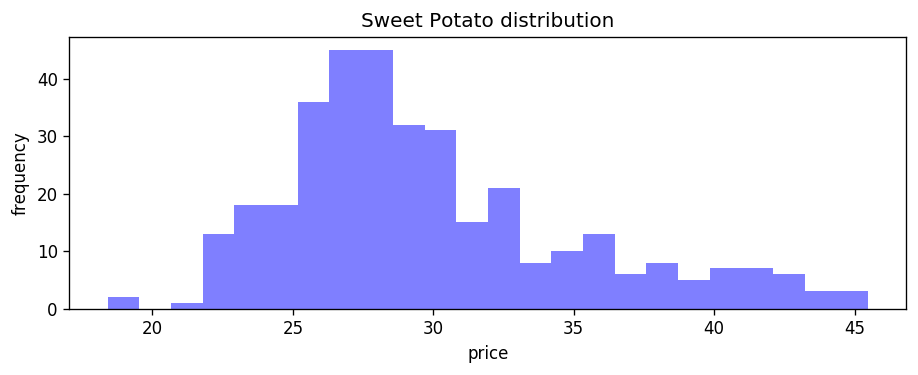

...

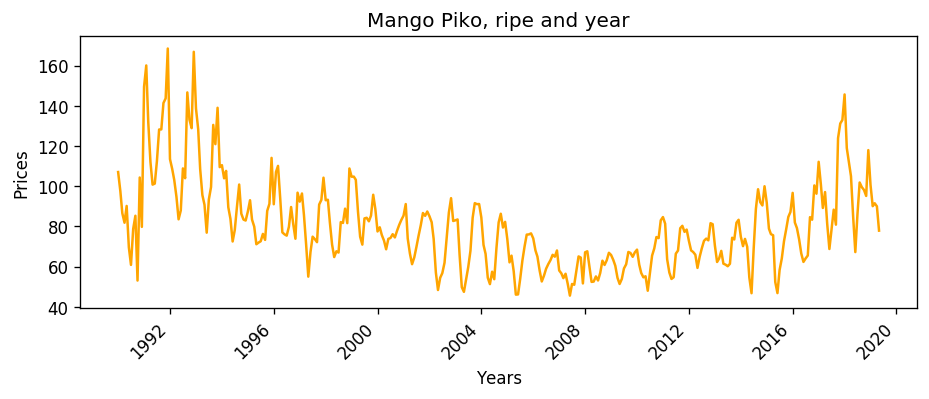

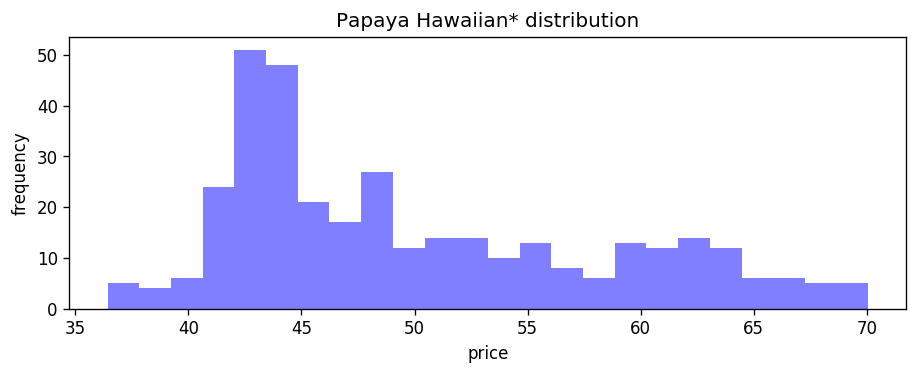

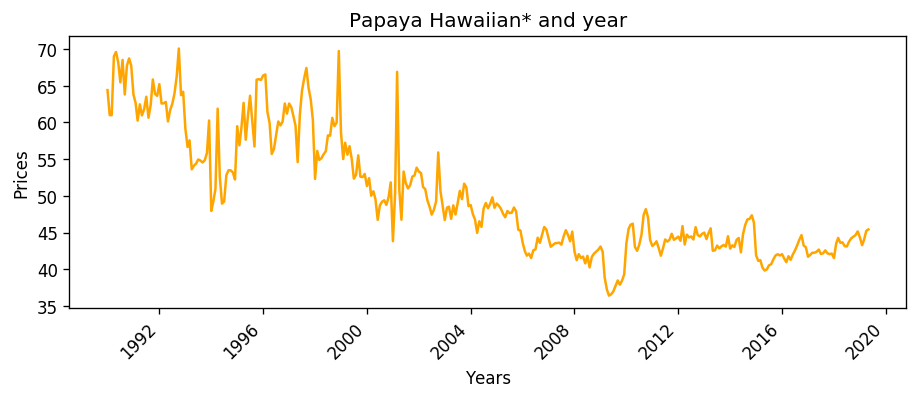

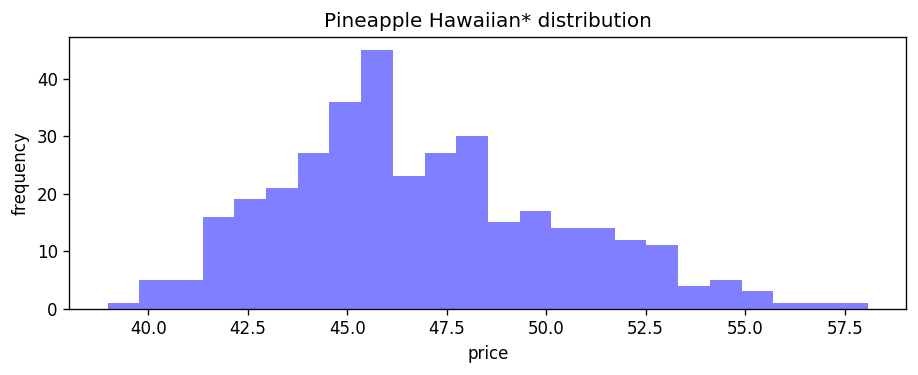

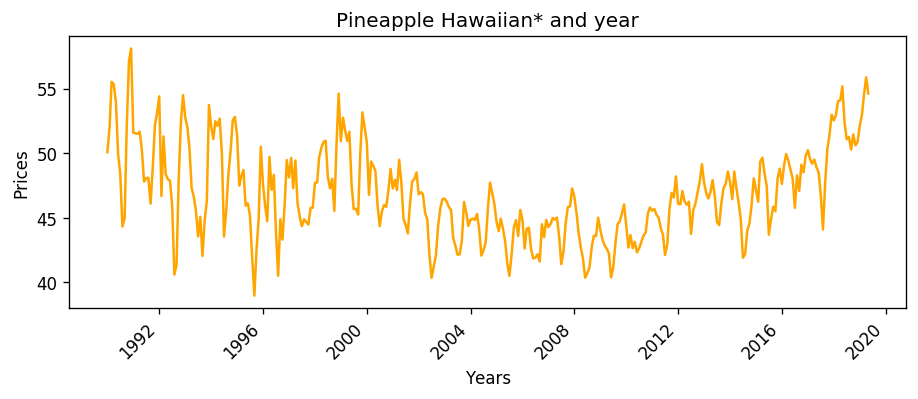

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 August,2018 September,2018 October,2018 November,2018 December,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Chicken Fully Dressed (broiler),266.821922,256.119614,258.488250,260.522615,265.402773,257.387165,255.208470,261.614977,...,157.267855,154.577088,153.24,153.175719,154.168192,150.137263,149.122381,149.483889,148.447826,148.64
1,PHILIPPINES,Chicken Broiler (live),223.332010,220.601563,216.162106,221.952247,216.341244,210.483562,195.733135,214.331130,...,140.238851,139.128402,137.41,136.547960,138.832986,128.953484,123.485381,125.493764,123.876806,124.09
2,PHILIPPINES,Chicken egg (other breed)*,8.899092,8.692181,8.166456,7.792990,7.792990,7.962931,8.318897,8.653566,...,5.838226,5.794510,5.82,5.839749,5.884205,5.803913,5.844392,5.854434,5.809699,5.75
3,PHILIPPINES,Duck egg*,11.061018,10.790294,10.706025,10.357772,9.753491,10.002218,10.040048,10.374717,...,8.519561,8.411063,8.33,8.404030,8.372902,8.429253,8.515541,8.354870,8.514214,8.50


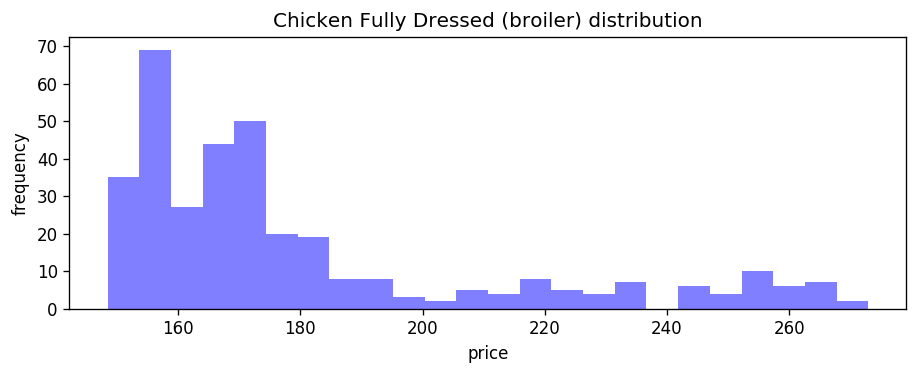

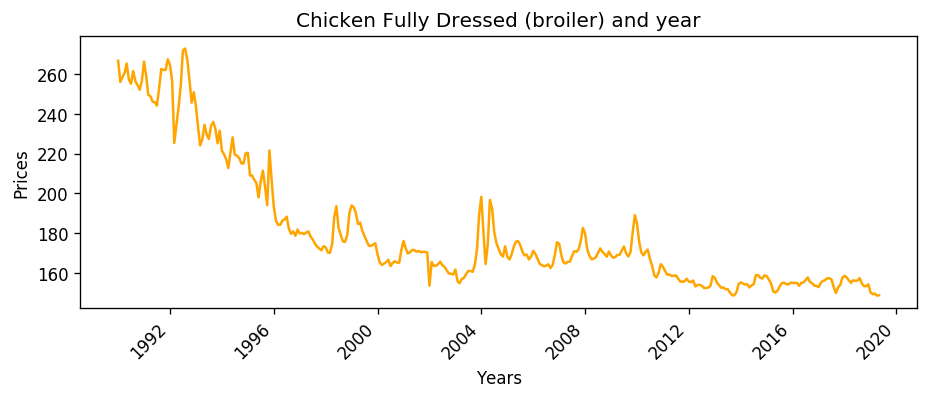

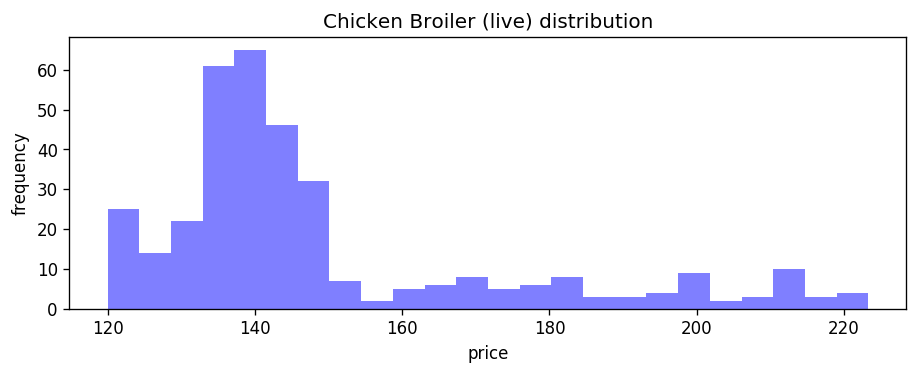

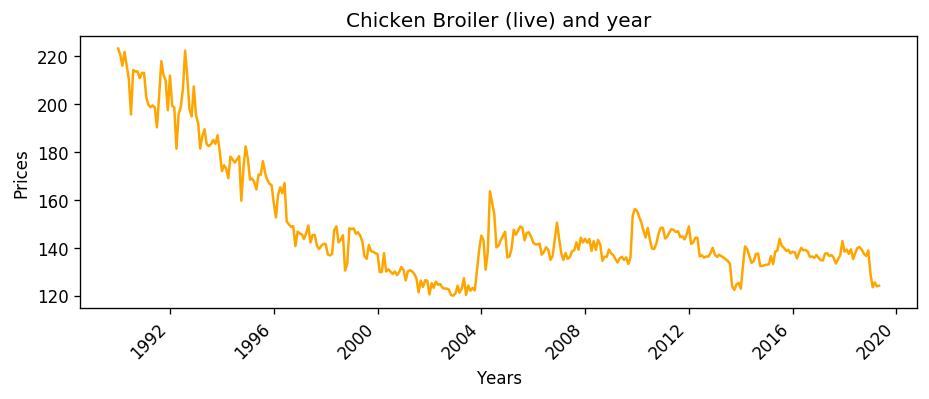

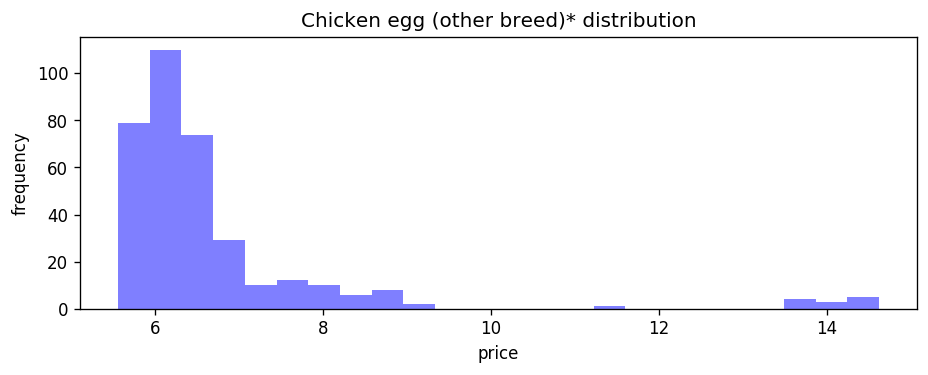

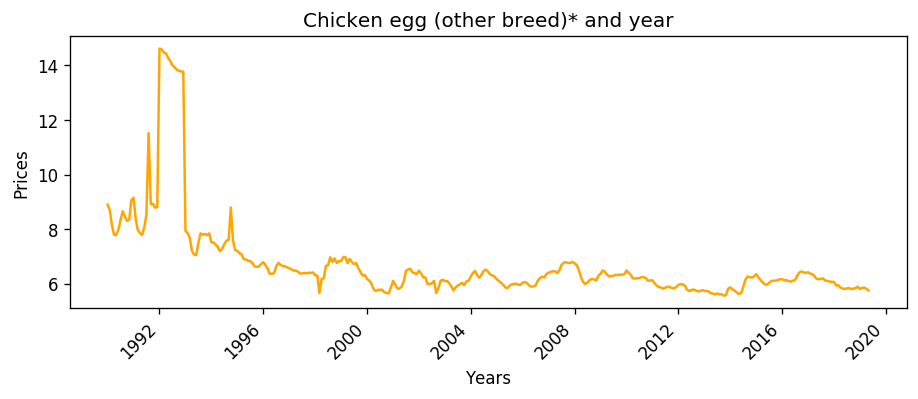

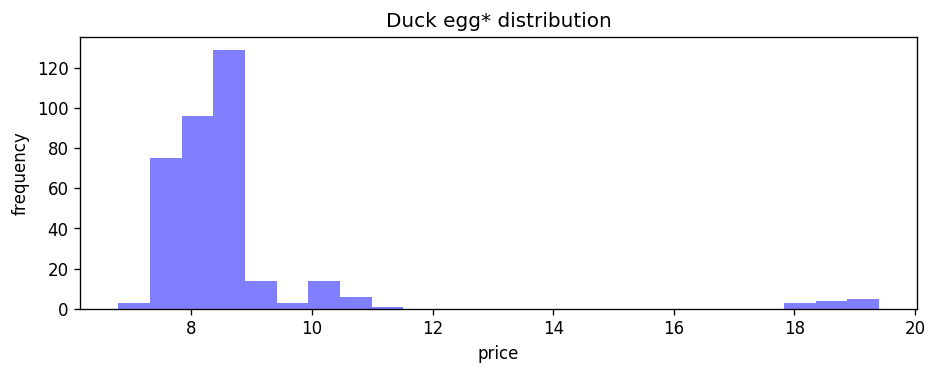

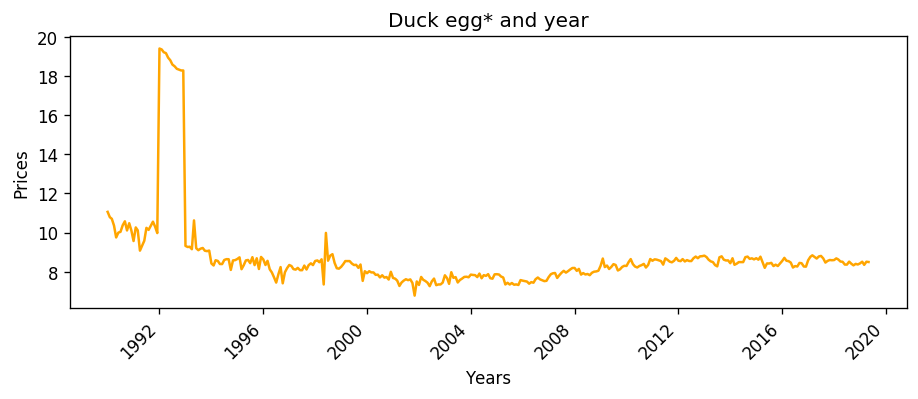

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 August,2018 September,2018 October,2018 November,2018 December,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Beef Lean Meat,357.270883,360.775473,364.204018,363.705748,362.104466,360.274055,360.485550,357.377916,...,295.685422,295.068904,293.85,295.663595,300.648629,301.984517,304.330159,305.525147,303.676973,305.24
1,PHILIPPINES,Beef Meat with bones,680.242937,675.882405,673.723037,667.326932,663.129907,656.932431,646.856781,646.856781,...,230.190034,229.625021,229.57,231.947224,235.781312,234.329202,236.195792,239.871132,237.716856,238.87
2,PHILIPPINES,Pork Lean Meat,262.799734,262.913502,264.812274,262.199588,260.452509,258.455363,254.252275,252.722363,...,225.393986,222.848050,220.47,219.867057,221.483902,220.498388,219.787309,218.552154,218.544849,217.85
3,PHILIPPINES,Pork Meat with bones,227.555308,226.596171,229.557086,229.252010,225.506585,221.456868,216.482569,216.578188,...,198.590760,197.153707,196.35,195.877007,198.128444,196.729505,196.891752,196.469992,196.167492,195.57
4,PHILIPPINES,Pork Pata (front),189.243964,188.830142,187.430124,186.735824,190.658686,187.323087,184.975941,184.067555,...,173.264797,171.830293,170.28,171.045552,172.415273,171.492040,172.439698,171.977770,171.316003,170.09


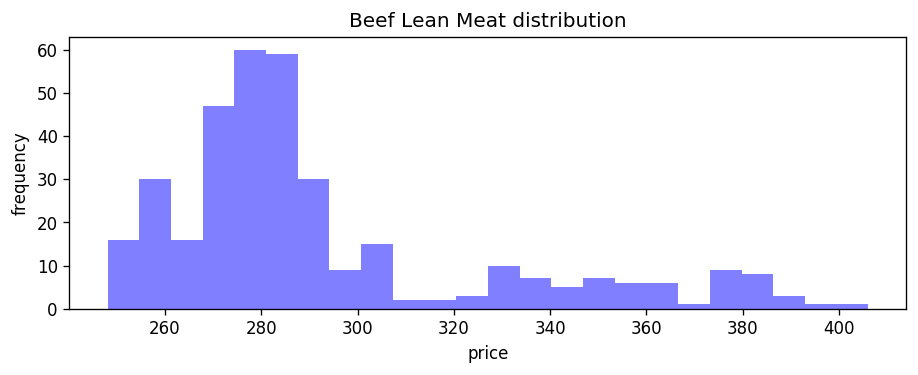

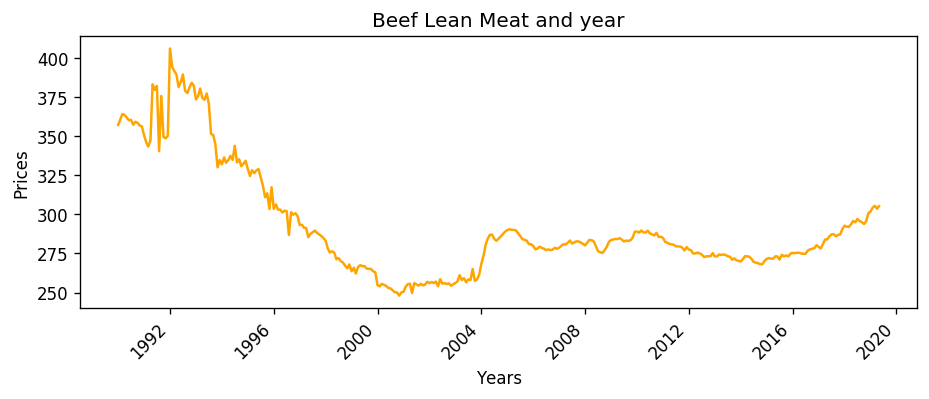

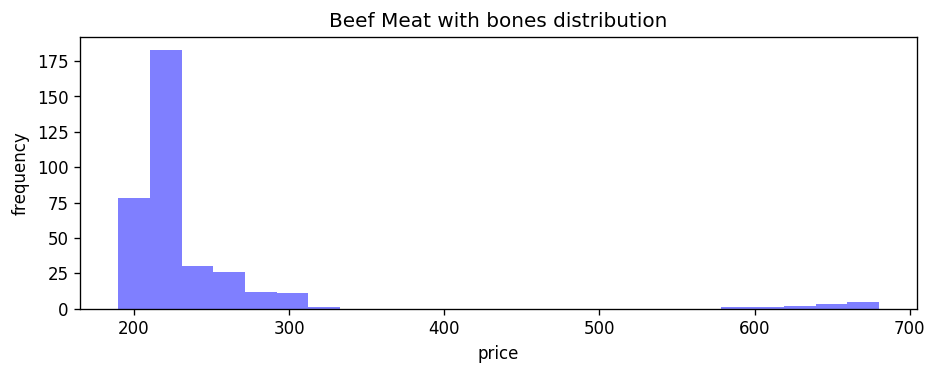

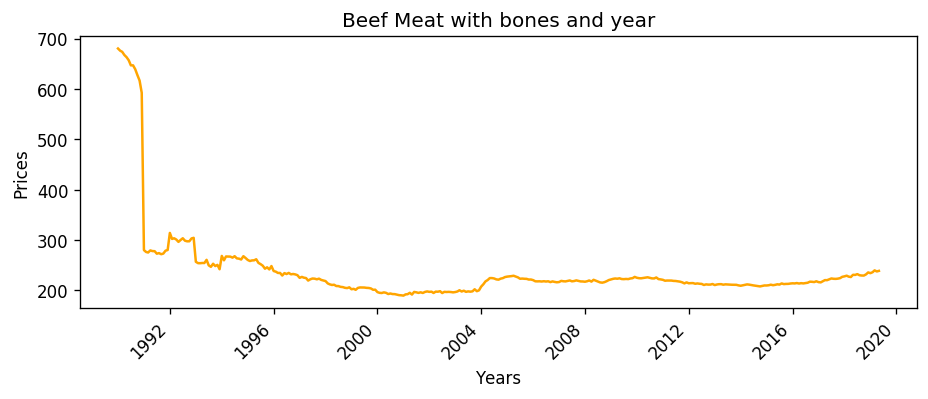

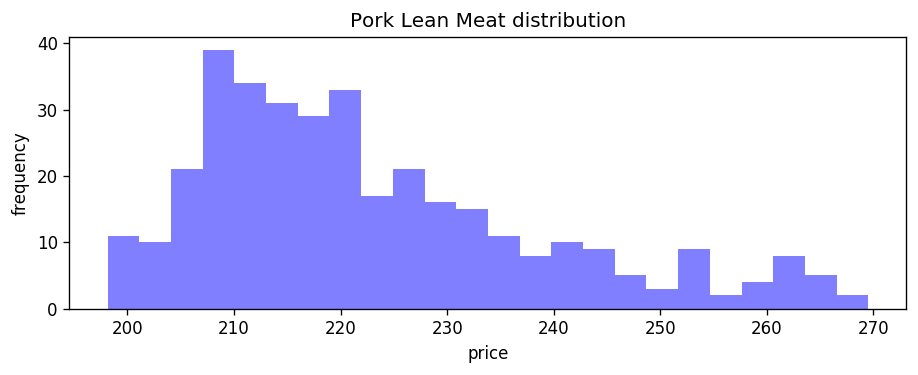

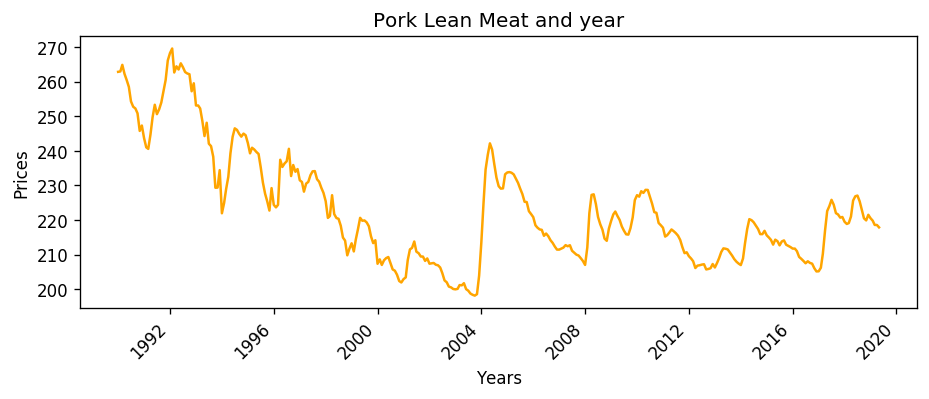

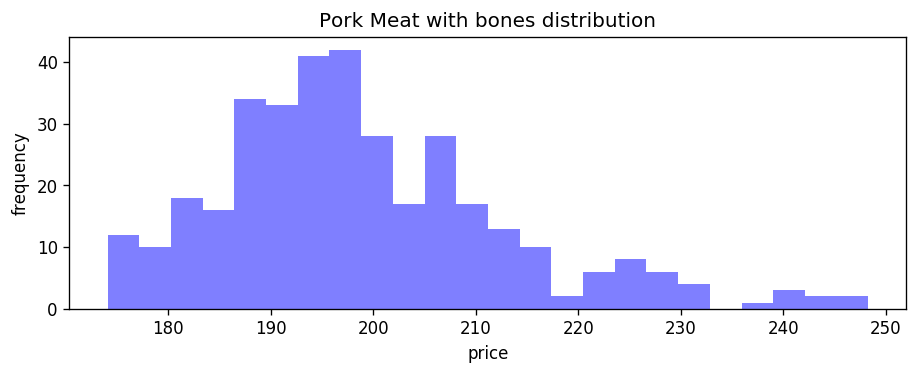

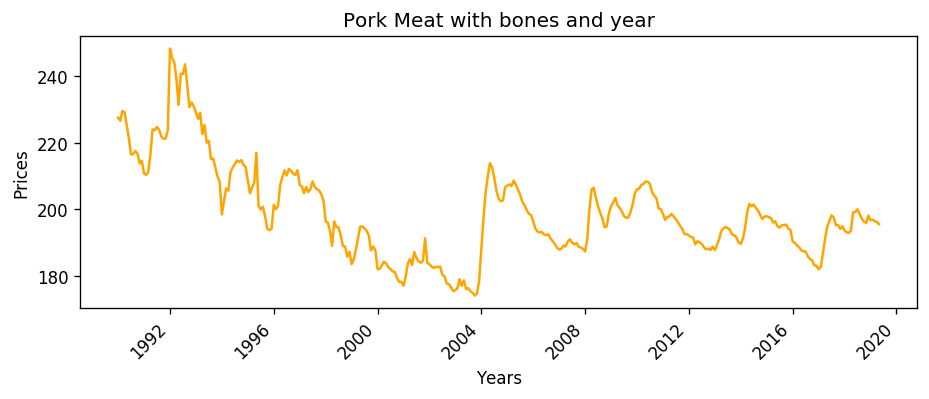

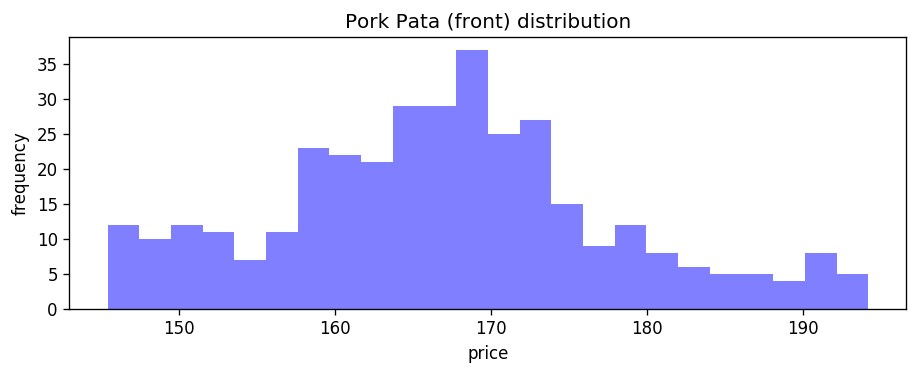

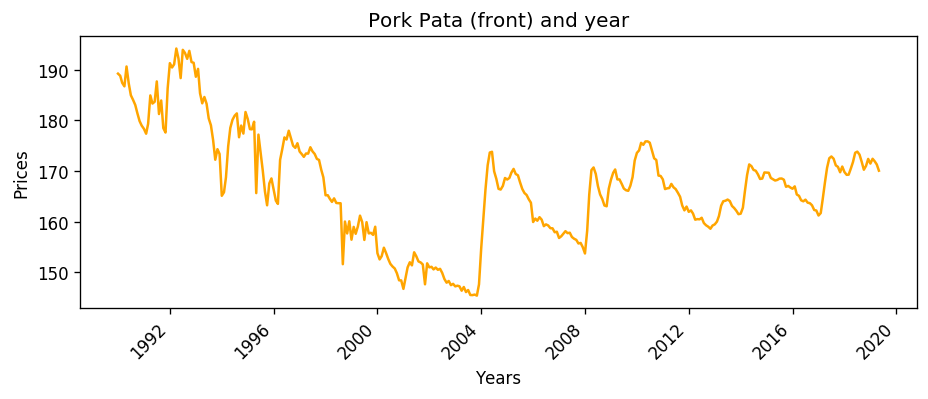

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 August,2018 September,2018 October,2018 November,2018 December,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Alumahan [Indian mackerel],164.306396,150.214878,151.179026,149.546492,156.644000,151.975444,147.875571,153.708361,...,199.390101,195.198812,189.50,187.893679,193.604458,205.178875,193.246538,186.076614,180.902007,181.08
1,PHILIPPINES,Bangus [Milkfish],228.611132,230.592576,230.801972,231.175596,229.378574,234.566571,217.869052,217.247525,...,159.453395,162.747548,165.06,165.876923,167.619243,171.693216,169.678173,164.536714,164.384431,164.37
2,PHILIPPINES,Bisugo [Threadfin bream],196.232516,196.523222,186.334624,189.053992,184.140022,186.351998,183.541648,184.163175,...,261.748834,253.955950,247.50,257.870502,267.549975,270.661495,269.022800,260.718139,259.653478,258.91
3,PHILIPPINES,"Crab, Alimasag [Blue crab]",191.456167,179.838231,189.222760,185.256142,178.748645,180.379800,171.206731,217.582193,...,292.821959,292.973657,292.33,306.712040,324.397040,331.869135,315.004711,312.032305,312.992525,308.33
4,PHILIPPINES,"Dalagang-Bukid, lapad [Caesio]",207.394089,212.209112,205.406286,206.908817,194.138575,201.500988,195.876565,197.215238,...,246.703007,243.820569,236.22,245.790334,261.464256,258.027674,257.715608,257.434434,246.781990,247.91
5,PHILIPPINES,Dilis [Anchovies],110.710735,107.553253,100.786018,110.186960,105.376909,112.452117,104.416504,107.571948,...,116.390152,116.852619,107.00,107.840033,116.283583,126.901495,121.567376,121.376580,118.838395,119.22
6,PHILIPPINES,Galunggong [Roundscad],142.536301,124.188289,134.696728,128.041785,111.944586,113.131880,117.325138,121.914874,...,151.490338,149.965540,147.20,147.766689,151.477981,157.620991,150.206907,141.952456,141.816756,143.40
7,PHILIPPINES,Sapsap [Slipmouth],153.295655,153.362047,148.888435,159.657650,152.379911,154.985820,142.042781,147.540903,...,213.788361,209.735213,200.04,213.836990,210.602153,217.752343,219.817435,212.747930,208.518110,217.66
8,PHILIPPINES,"Shrimp, Suaje [Endeavor prawn]",371.046879,353.332168,358.726517,527.013279,359.604828,358.040550,364.836237,351.114838,...,391.656959,370.658192,373.15,372.932592,389.193827,407.330059,386.151651,390.359212,394.598763,393.30
9,PHILIPPINES,"Shrimp, Sugpo [Tiger prawn]",710.670411,676.491478,651.623432,689.383679,662.110075,680.830566,645.575116,690.133808,...,573.795456,576.894644,561.45,595.814682,623.332801,638.178925,634.447946,621.644510,618.702893,629.47


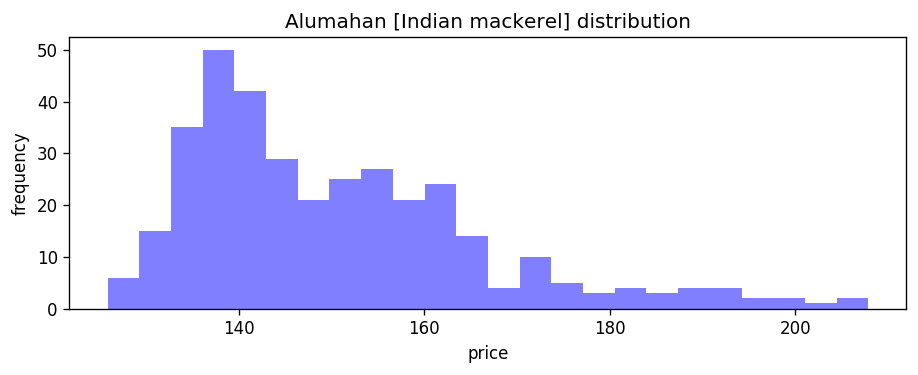

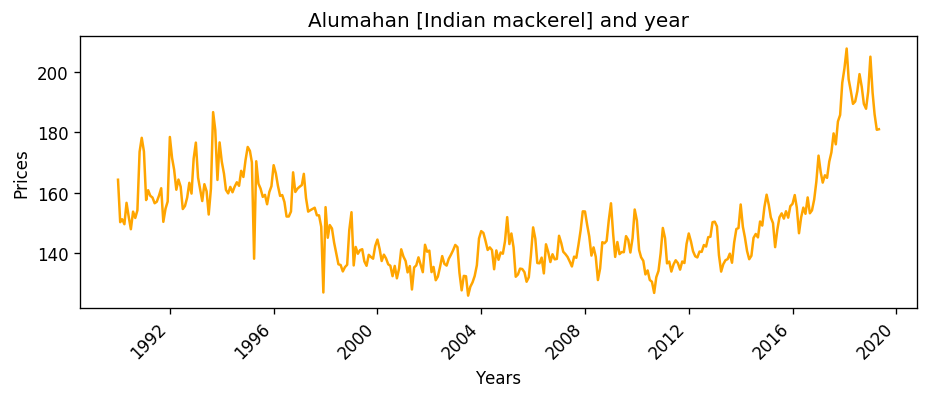

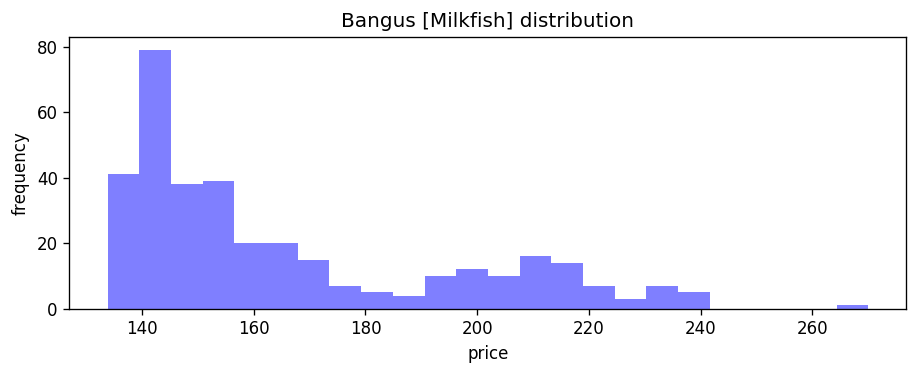

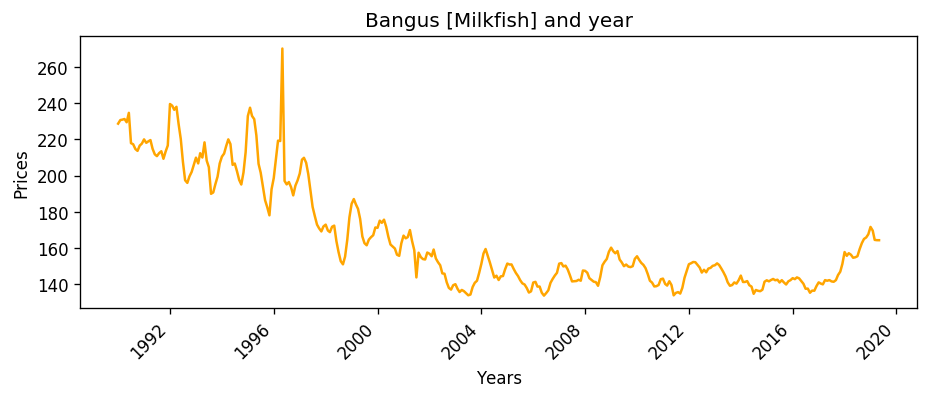

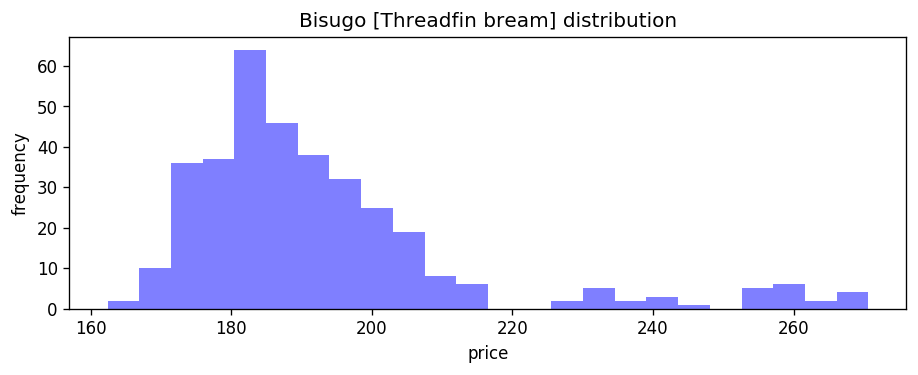

...

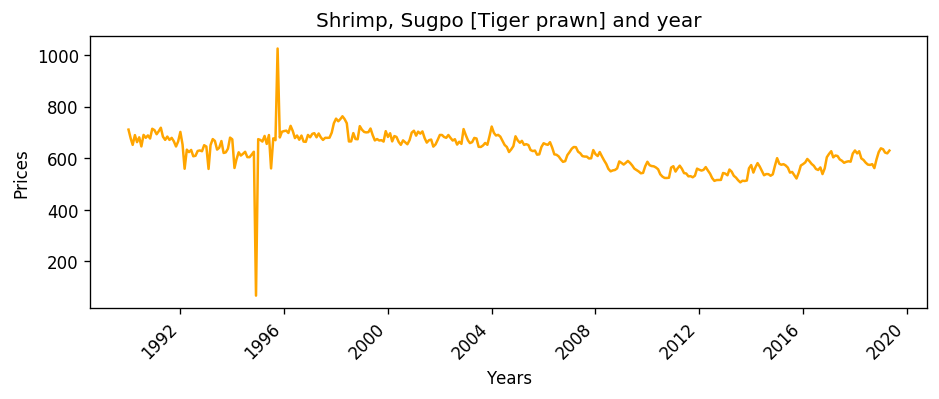

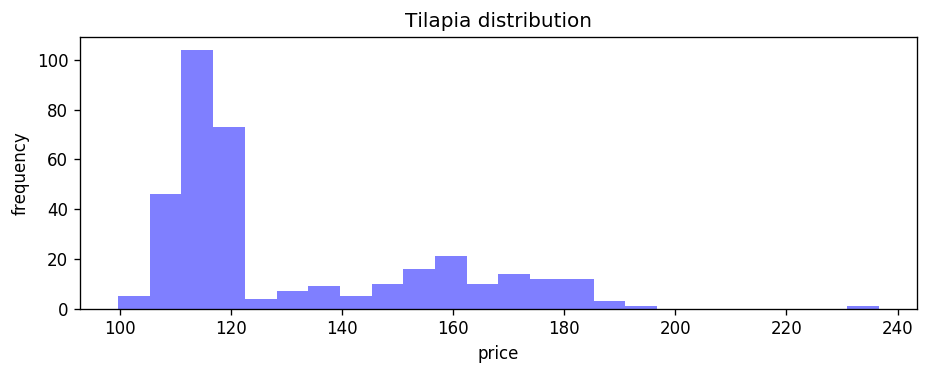

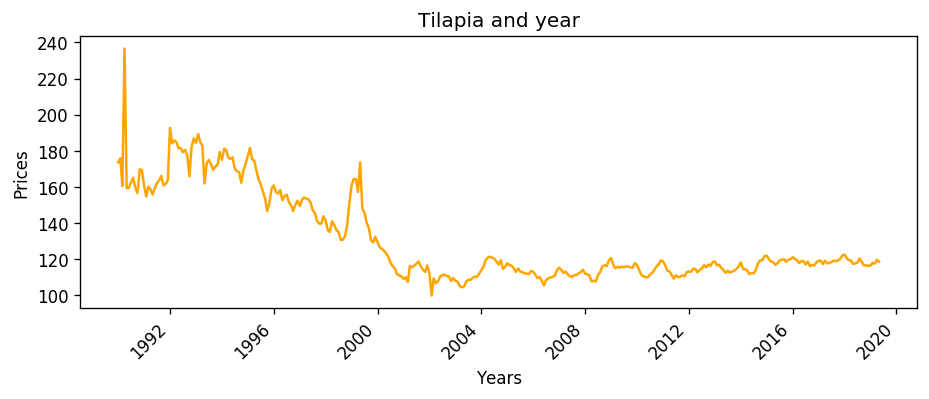

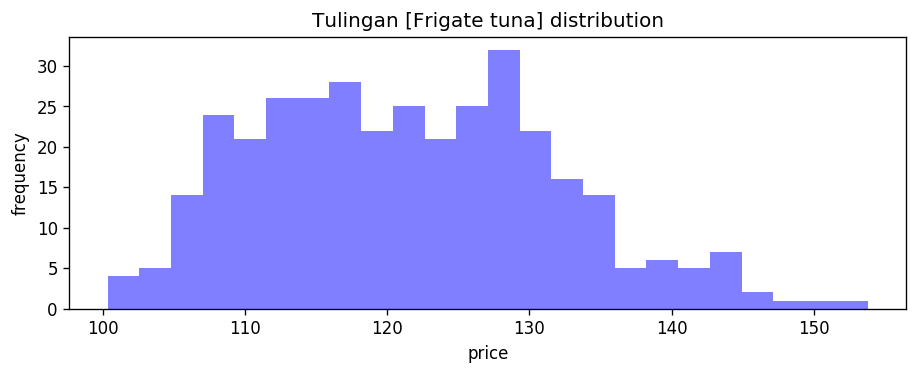

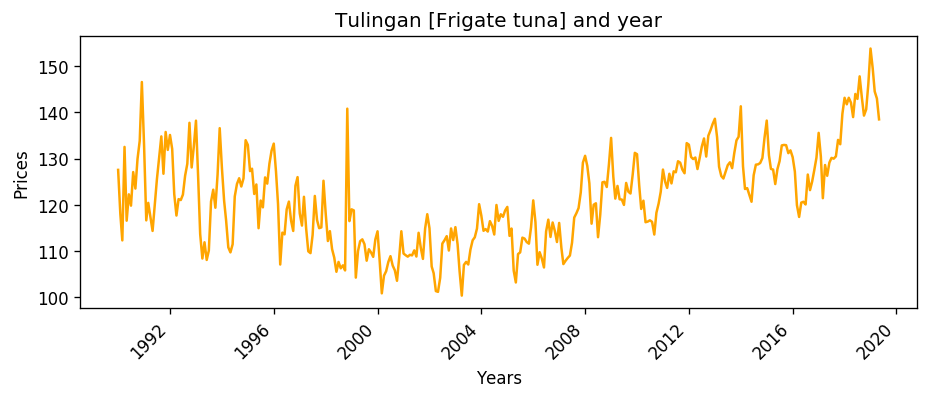

In [82]:
def histo_graph():
    for file in national_f:
        province = pd.read_csv(DSDATA / 'P_NATIONAL' / file , encoding = "ISO-8859-1")
        display(province)
        #province = normaliser(province)
        #hist = province.hist(bins=10000,histtype='step')
        num_bins = 24
        #date = list(province.columns[2:]).astype('datetime64[ns]') 
        for x in range(province.shape[0]):
            n, bins, patches = plt.hist(province.iloc[x,2:].astype(float), num_bins, facecolor='blue', alpha=0.5)
            plt.xlabel('price')
            plt.ylabel('frequency')
            plt.title( province.iloc[x,1] +' distribution')
            plt.show()
            years = pd.to_datetime(pd.Series(list(province.columns[2:])), format='%Y %B')
            plt.plot(years,province.iloc[x,2:], color='orange')
            plt.xlabel('Years')
            plt.ylabel('Prices')
            plt.xticks(rotation=45, ha='right')
            plt.title( province.iloc[x,1]+' and year')
            plt.show()

histo_graph()   

# Unprocessed Visualization
- no cpi used
- mean was used to fill null values
- Output: Histogram and Line graph(x-axis:years y-axis:prices)

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 September,2018 October,2018 November,2018 December,2018 Annual,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Beef Lean Meat,71.060000,72.220000,73.140000,73.740000,73.880000,74.200000,75.400000,74.750000,...,294.33,293.85,295.17,298.39,288.73,300.22,303.06,304.25,303.17,305.24
1,PHILIPPINES,Beef Meat with bones,135.298076,135.298076,135.298076,135.298076,135.298076,135.298076,135.298076,135.298076,...,229.05,229.57,231.56,234.01,225.37,232.96,235.21,238.87,237.32,238.87
2,PHILIPPINES,Pork Lean Meat,52.270000,52.630000,53.180000,53.160000,53.140000,53.230000,53.180000,52.860000,...,222.29,220.47,219.50,219.82,217.63,219.21,218.87,217.64,218.18,217.85
3,PHILIPPINES,Pork Meat with bones,45.260000,45.360000,46.100000,46.480000,46.010000,45.610000,45.280000,45.300000,...,196.66,196.35,195.55,196.64,192.37,195.58,196.07,195.65,195.84,195.57
4,PHILIPPINES,Pork Pata (front),37.640000,37.800000,37.640000,37.860000,38.900000,38.580000,38.690000,38.500000,...,171.40,170.28,170.76,171.12,167.81,170.49,171.72,171.26,171.03,170.09


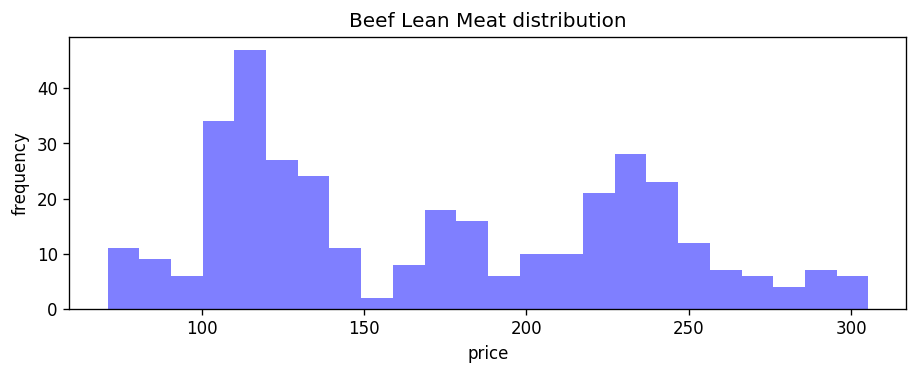

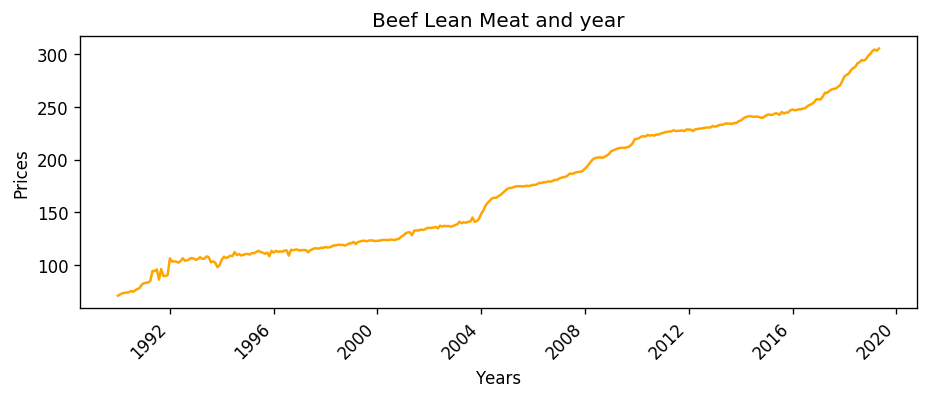

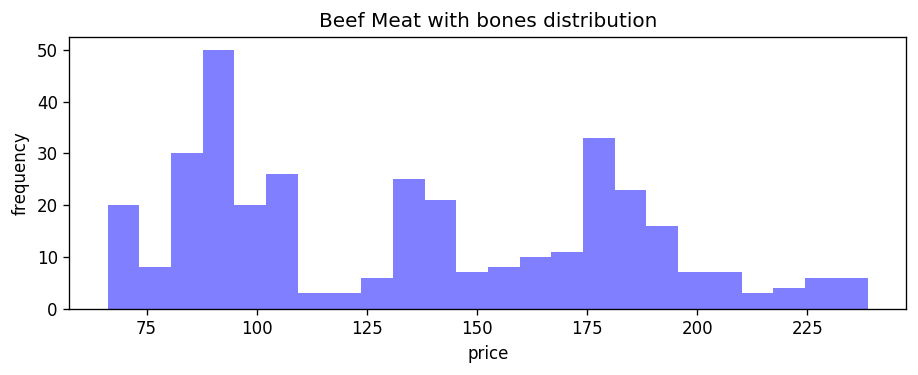

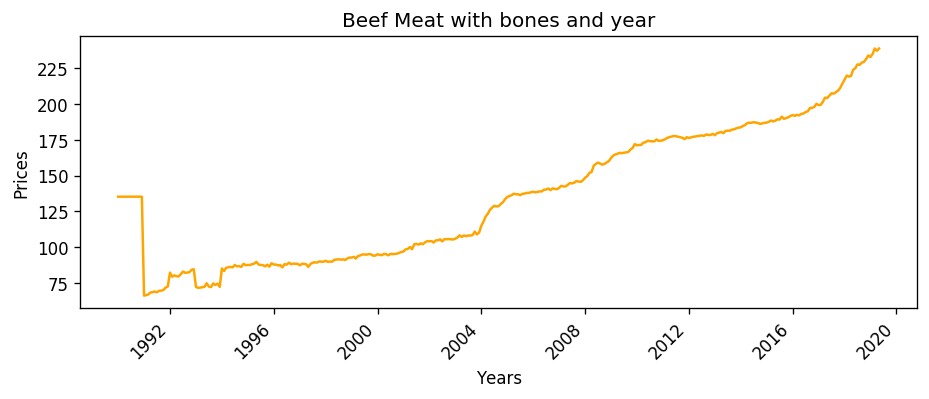

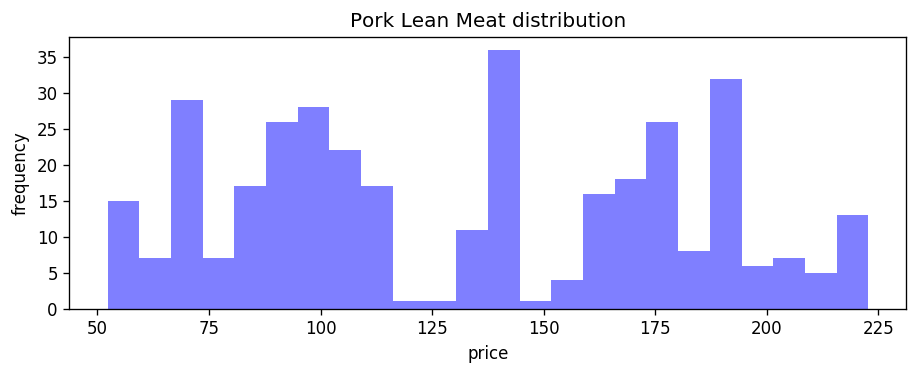

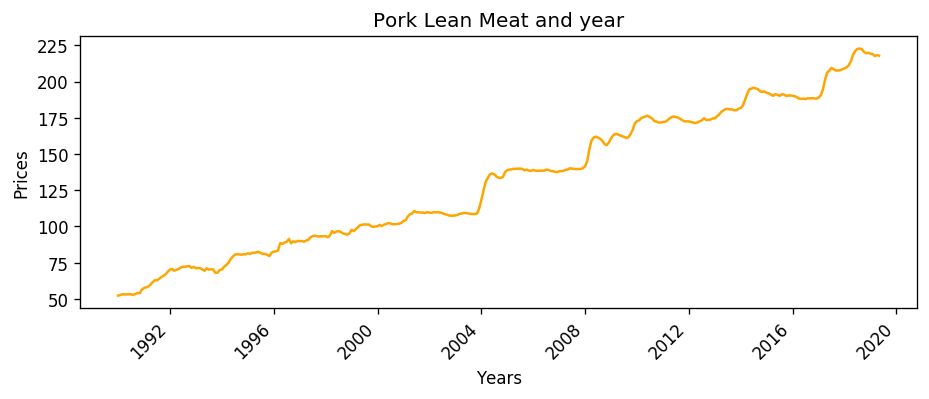

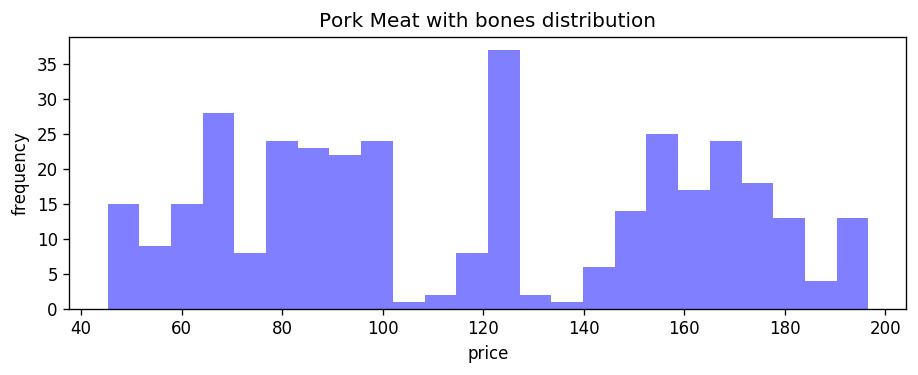

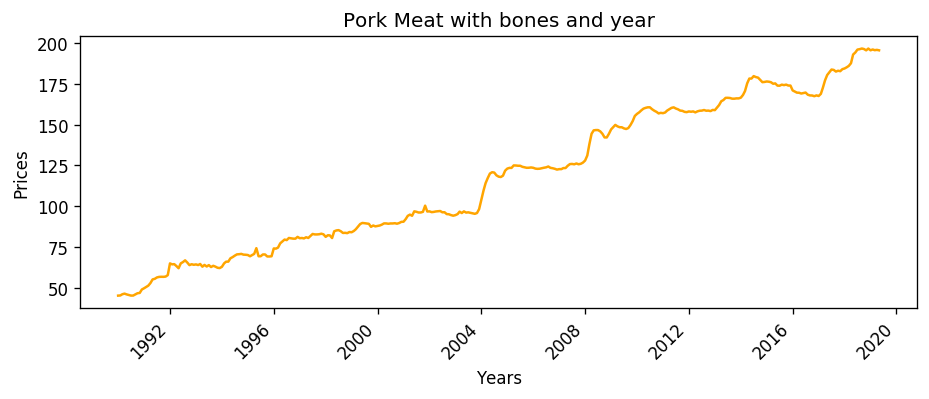

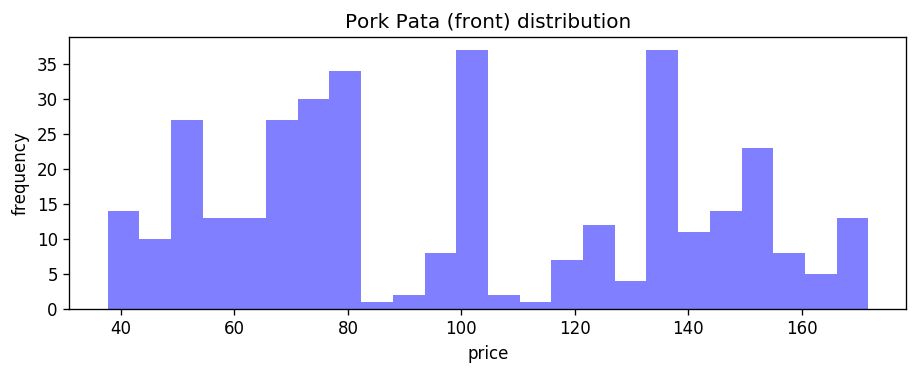

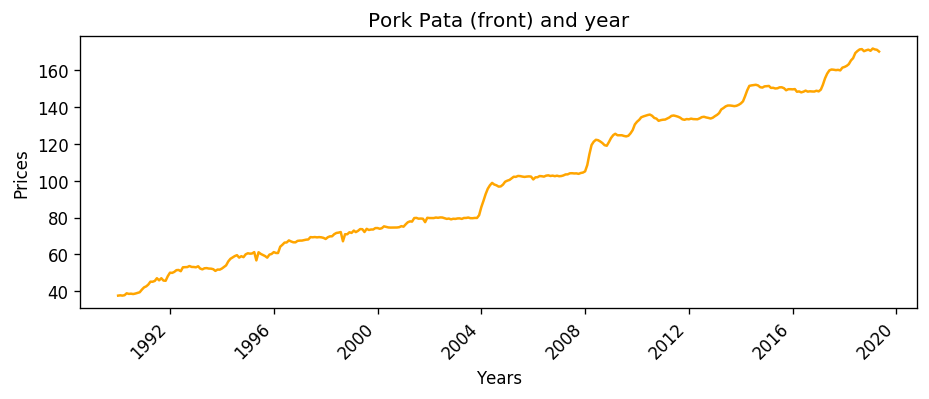

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 September,2018 October,2018 November,2018 December,2018 Annual,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Alumahan [Indian mackerel],32.68,30.07,30.36,30.32,31.96,31.30,30.93,32.15,...,194.71,189.50,187.58,192.15,190.43,203.98,192.44,185.30,180.60,181.08
1,PHILIPPINES,Bangus [Milkfish],45.47,46.16,46.35,46.87,46.80,48.31,45.57,45.44,...,162.34,165.06,165.60,166.36,156.18,170.69,168.97,163.85,164.11,164.37
2,PHILIPPINES,Bisugo [Threadfin bream],39.03,39.34,37.42,38.33,37.57,38.38,38.39,38.52,...,253.32,247.50,257.44,265.54,253.30,269.08,267.90,259.63,259.22,258.91
3,PHILIPPINES,"Crab, Alimasag [Blue crab]",38.08,36.00,38.00,37.56,36.47,37.15,35.81,45.51,...,292.24,292.33,306.20,321.96,292.37,329.93,313.69,310.73,312.47,308.33
4,PHILIPPINES,"Dalagang-Bukid, lapad [Caesio]",41.25,42.48,41.25,41.95,39.61,41.50,40.97,41.25,...,243.21,236.22,245.38,259.50,243.86,256.52,256.64,256.36,246.37,247.91
5,PHILIPPINES,Dilis [Anchovies],22.02,21.53,20.24,22.34,21.50,23.16,21.84,22.50,...,116.56,107.00,107.66,115.41,111.47,126.16,121.06,120.87,118.64,119.22
6,PHILIPPINES,Galunggong [Roundscad],28.35,24.86,27.05,25.96,22.84,23.30,24.54,25.50,...,149.59,147.20,147.52,150.34,144.22,156.70,149.58,141.36,141.58,143.40
7,PHILIPPINES,Sapsap [Slipmouth],30.49,30.70,29.90,32.37,31.09,31.92,29.71,30.86,...,209.21,200.04,213.48,209.02,208.87,216.48,218.90,211.86,208.17,217.66
8,PHILIPPINES,"Shrimp, Suaje [Endeavor prawn]",73.80,70.73,72.04,106.85,73.37,73.74,76.31,73.44,...,369.73,373.15,372.31,386.27,382.82,404.95,384.54,388.73,393.94,393.30
9,PHILIPPINES,"Shrimp, Sugpo [Tiger prawn]",141.35,135.42,130.86,139.77,135.09,140.22,135.03,144.35,...,575.45,561.45,594.82,618.65,583.64,634.45,631.80,619.05,617.67,629.47


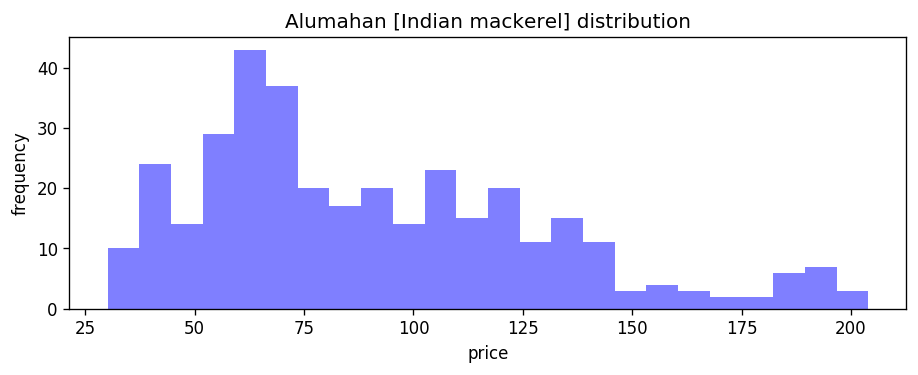

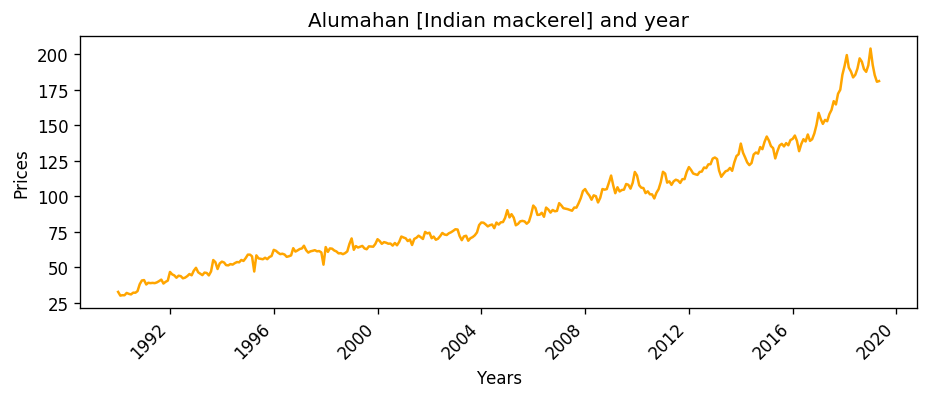

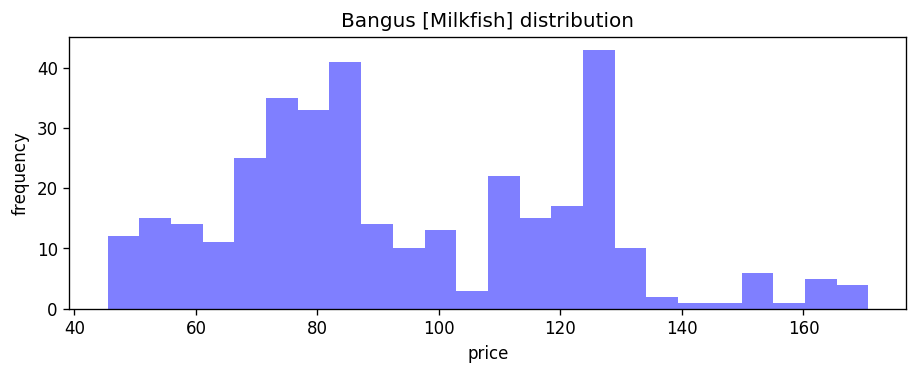

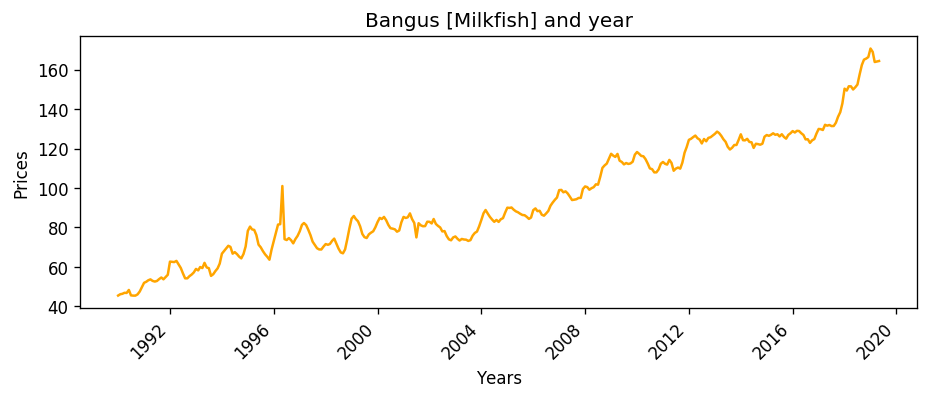

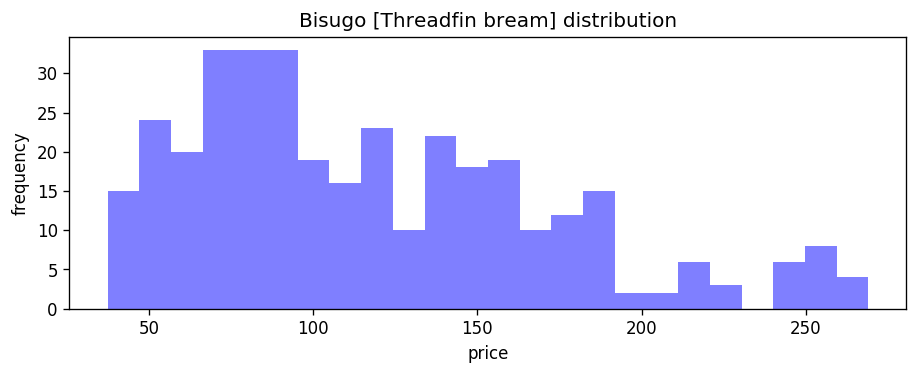

...

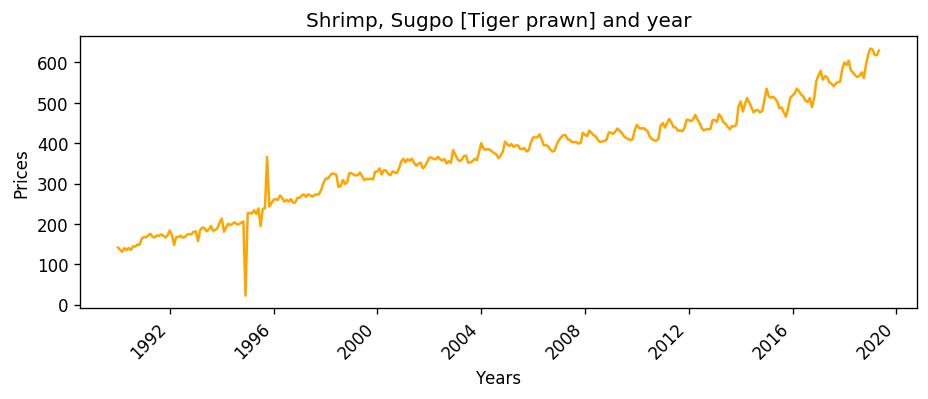

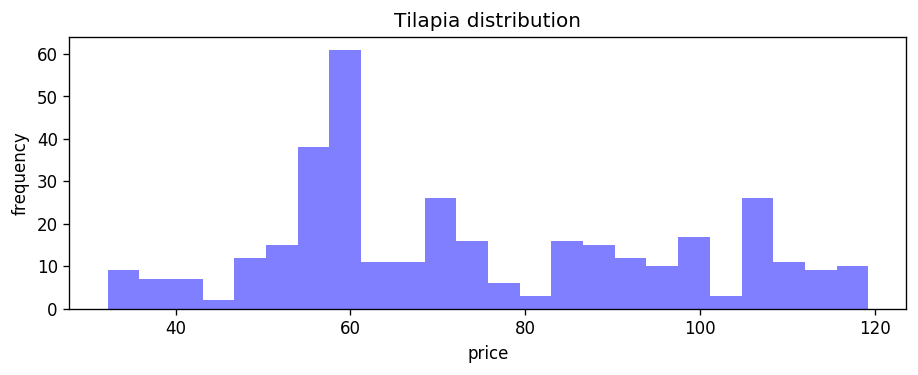

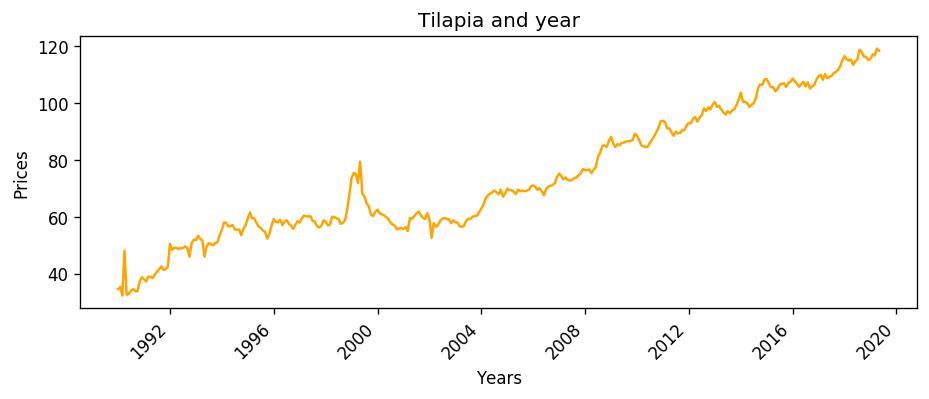

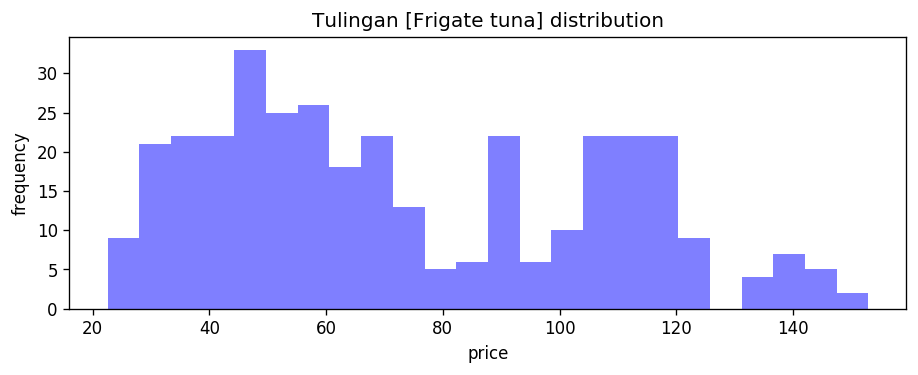

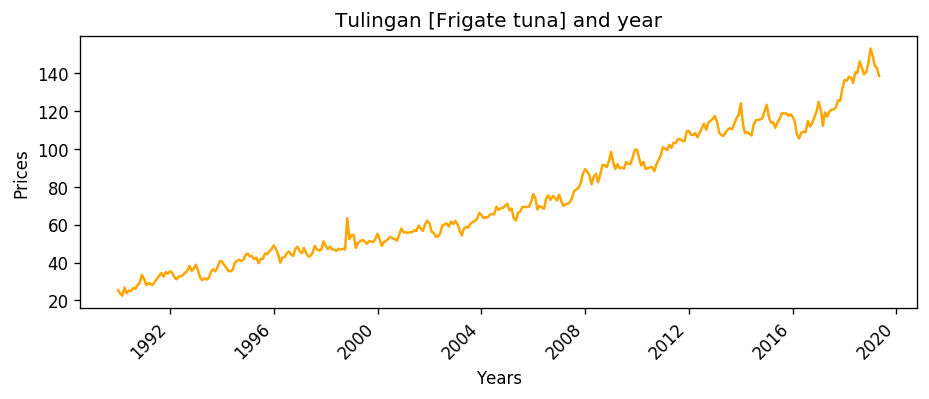

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 September,2018 October,2018 November,2018 December,2018 Annual,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Chicken Fully Dressed (broiler),53.07,51.27,51.91,52.82,54.15,53.01,53.38,54.72,...,154.19,153.24,152.92,153.01,152.31,149.26,148.50,148.86,148.20,148.64
1,PHILIPPINES,Chicken Broiler (live),44.42,44.16,43.41,45.00,44.14,43.35,40.94,44.83,...,138.78,137.41,136.32,137.79,135.40,128.20,122.97,124.97,123.67,124.09
2,PHILIPPINES,Chicken egg (other breed)*,1.77,1.74,1.64,1.58,1.59,1.64,1.74,1.81,...,5.78,5.82,5.83,5.84,5.74,5.77,5.82,5.83,5.80,5.75
3,PHILIPPINES,Duck egg*,2.20,2.16,2.15,2.10,1.99,2.06,2.10,2.17,...,8.39,8.33,8.39,8.31,8.30,8.38,8.48,8.32,8.50,8.50


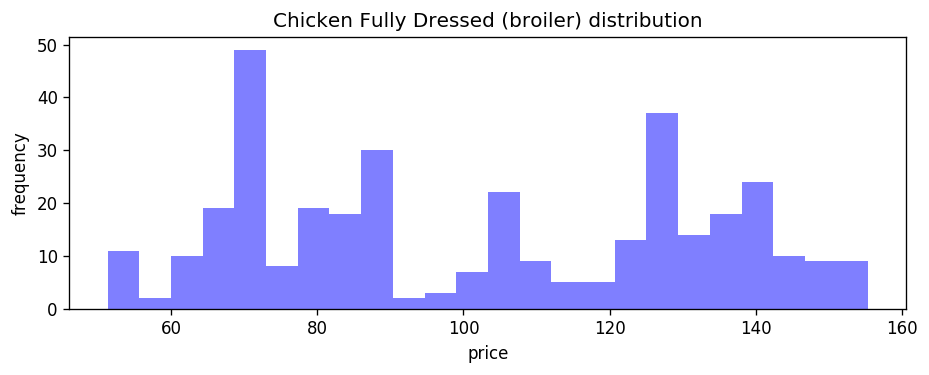

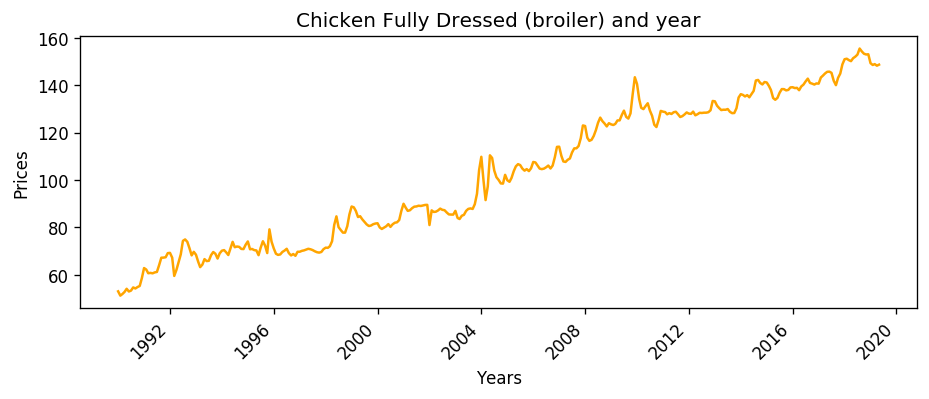

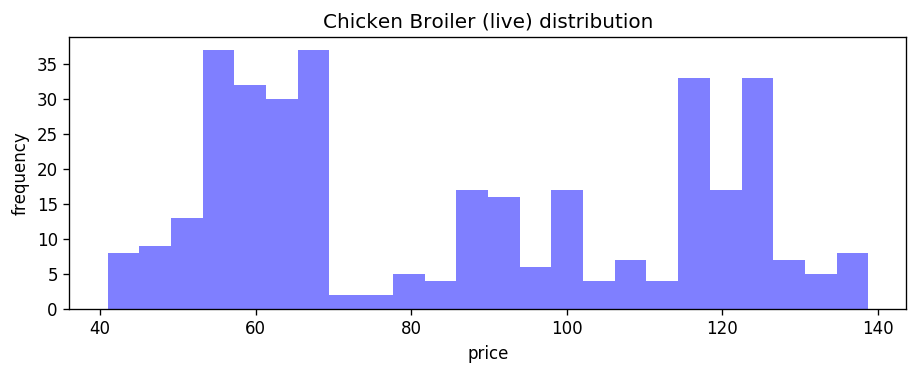

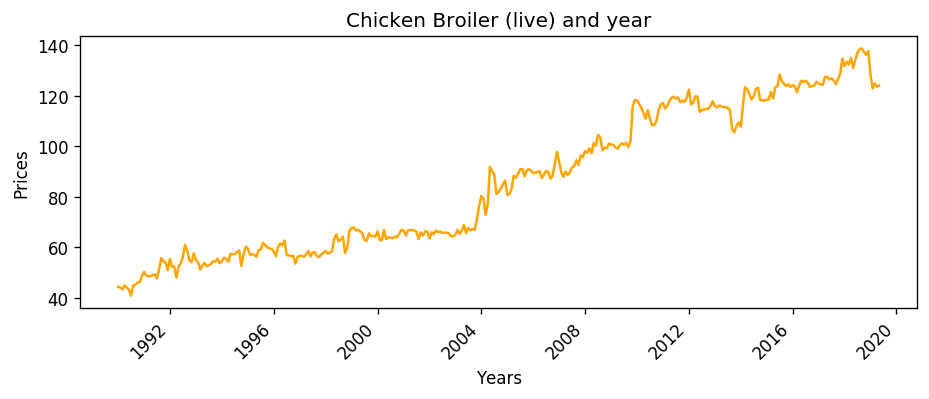

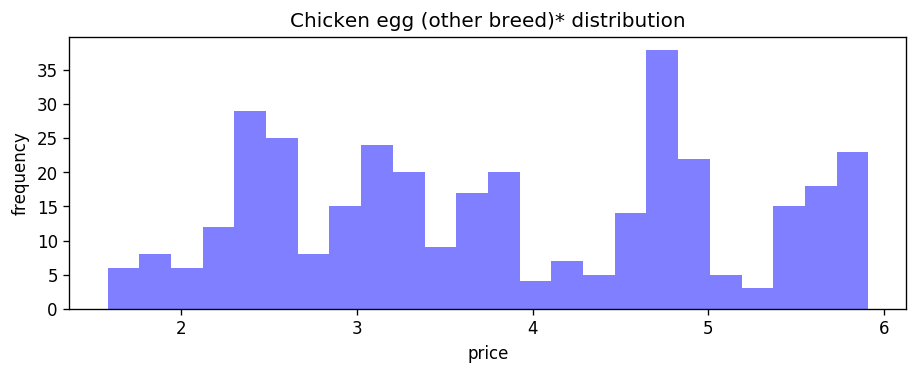

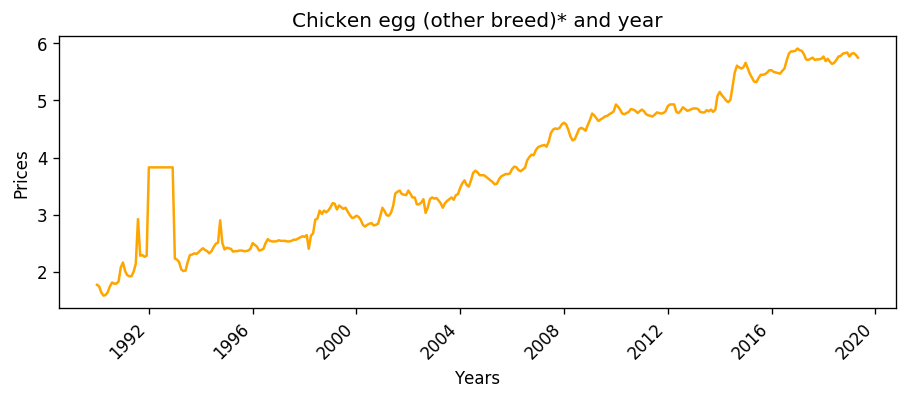

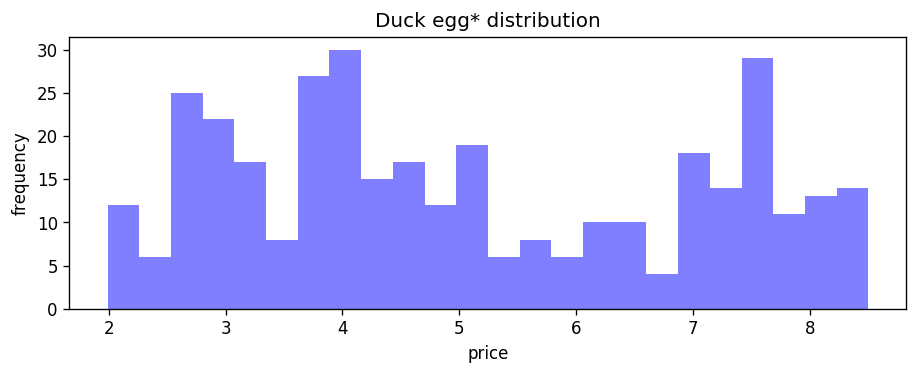

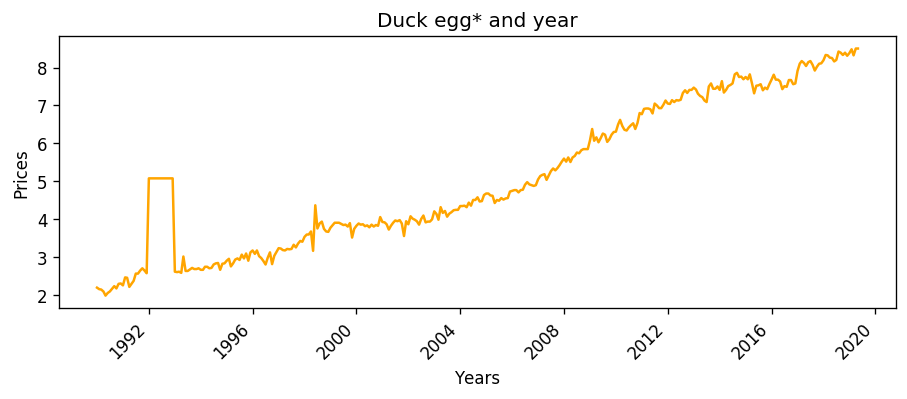

,Geolocation,Commodity,1990 January,1990 February,1990 March,1990 April,1990 May,1990 June,1990 July,1990 August,...,2018 September,2018 October,2018 November,2018 December,2018 Annual,2019 January,2019 February,2019 March,2019 April,2019 May
0,PHILIPPINES,Carrots,21.320000,17.720000,18.590000,20.640000,26.260000,34.050000,42.280000,38.400000,...,125.06,102.72,85.17,75.90,79.89,68.16,61.46,63.31,76.09,78.06
1,PHILIPPINES,"Gabi Cebu, for ginataan [Taro (cocoyam)]",7.870000,8.120000,8.450000,22.400184,22.400184,10.100000,10.870000,12.090000,...,46.66,46.38,46.45,45.62,43.73,47.47,47.89,46.49,49.23,49.72
2,PHILIPPINES,Sweet Potato,3.660000,3.790000,5.130000,5.580000,5.640000,6.050000,6.900000,7.460000,...,45.38,43.50,42.77,42.63,39.83,42.53,40.11,37.98,39.26,41.06
3,PHILIPPINES,White/Irish Potato,19.490000,16.770000,16.910000,10.900000,16.120000,16.990000,20.190000,21.300000,...,74.58,76.74,88.18,80.81,73.33,74.75,68.88,67.62,70.56,72.66
4,PHILIPPINES,Ampalaya [Bitter gourd],12.890000,11.810000,10.590000,10.960000,11.560000,13.090000,14.130000,10.900000,...,78.64,76.24,75.87,69.89,75.50,83.49,76.91,71.64,74.78,72.45
5,PHILIPPINES,Chayote,6.070000,6.610000,6.920000,6.620000,7.430000,8.430000,8.790000,7.140000,...,56.87,48.32,38.07,34.17,35.51,37.26,36.77,30.55,34.99,37.83
6,PHILIPPINES,"Eggplant long, purple",10.910000,9.660000,8.990000,9.220000,9.380000,9.260000,11.530000,10.230000,...,62.07,56.46,59.79,55.20,56.03,66.47,54.31,53.20,56.55,54.95
7,PHILIPPINES,Squash,7.260000,7.060000,6.650000,6.840000,7.050000,7.250000,8.310000,8.340000,...,37.51,31.97,29.50,29.08,33.49,28.98,29.65,29.48,36.41,38.51
8,PHILIPPINES,Tomato,9.250000,6.540000,6.430000,6.820000,8.500000,13.080000,12.900000,10.280000,...,62.57,45.01,50.50,51.96,50.69,46.34,45.36,38.56,38.63,56.52
9,PHILIPPINES,Upo [Bottle gourd],5.760000,5.130000,5.100000,5.260000,5.720000,6.000000,7.040000,6.100000,...,36.27,32.86,31.37,30.58,31.81,31.75,31.22,30.65,32.30,32.26


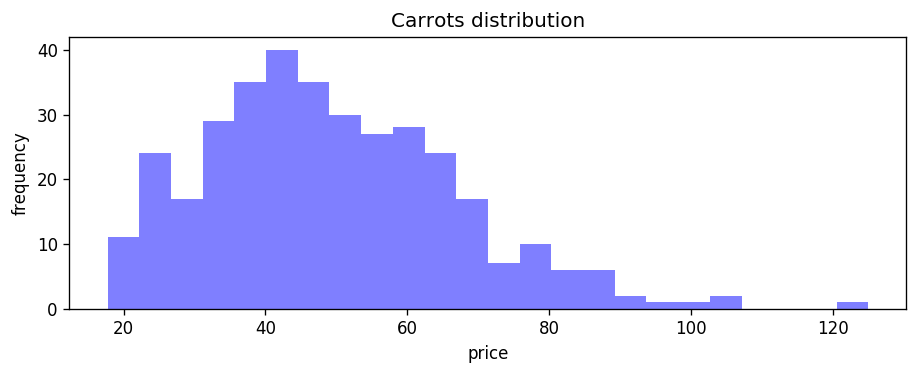

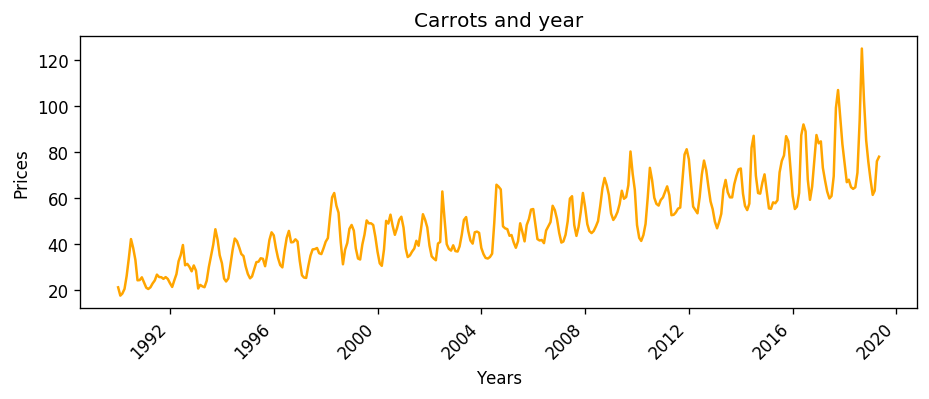

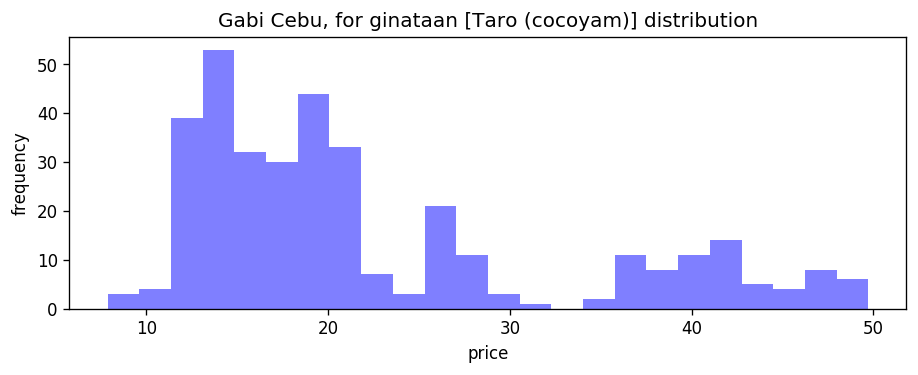

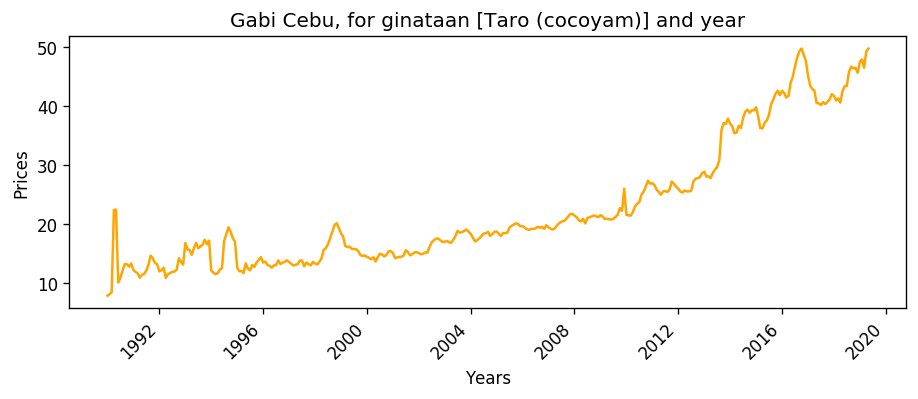

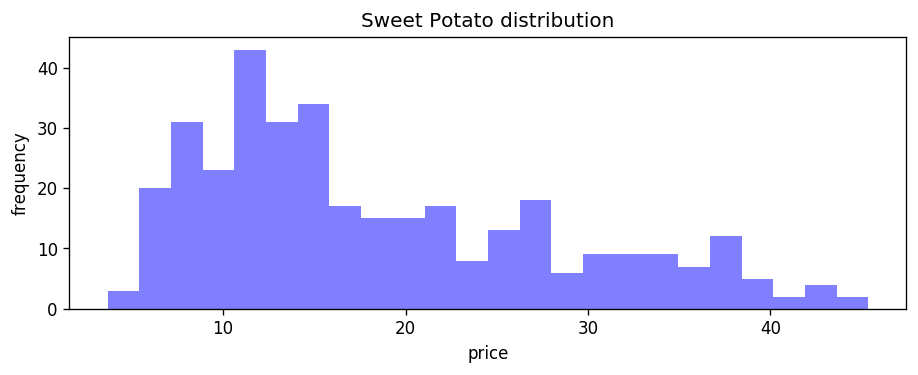

...

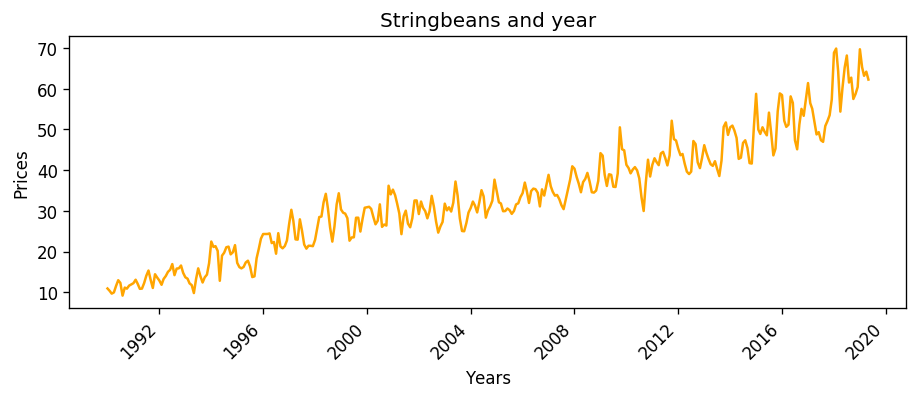

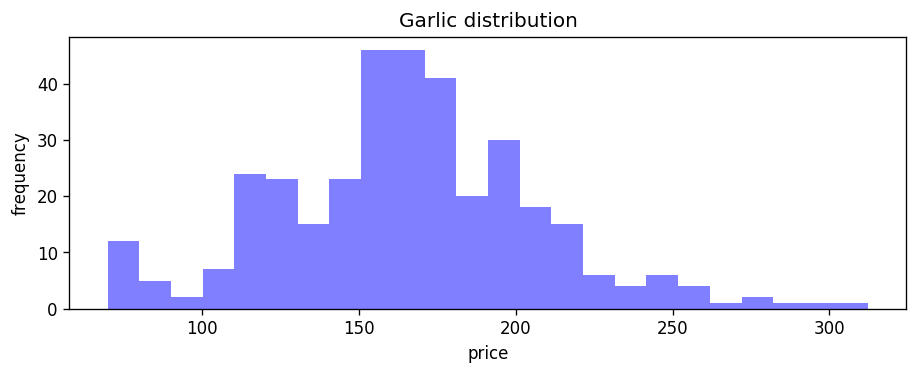

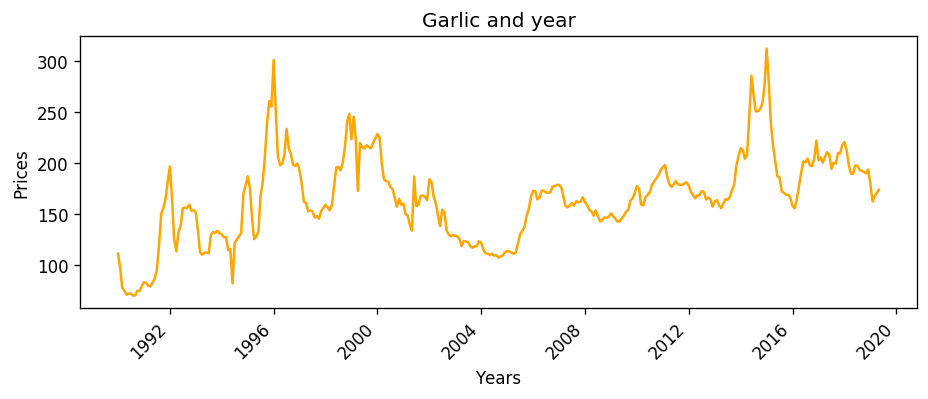

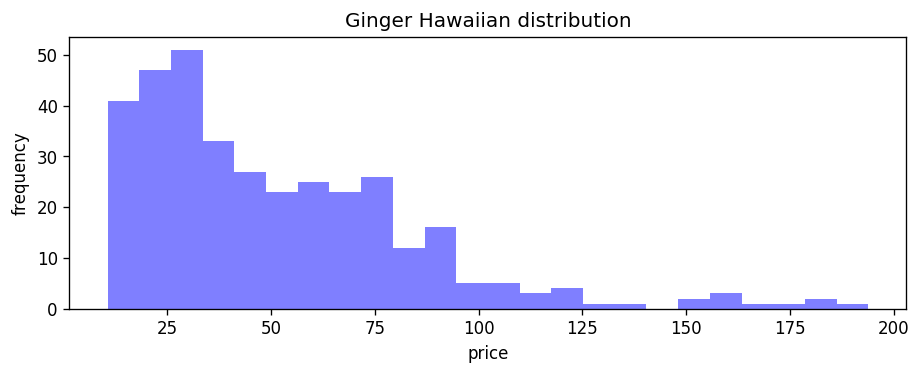

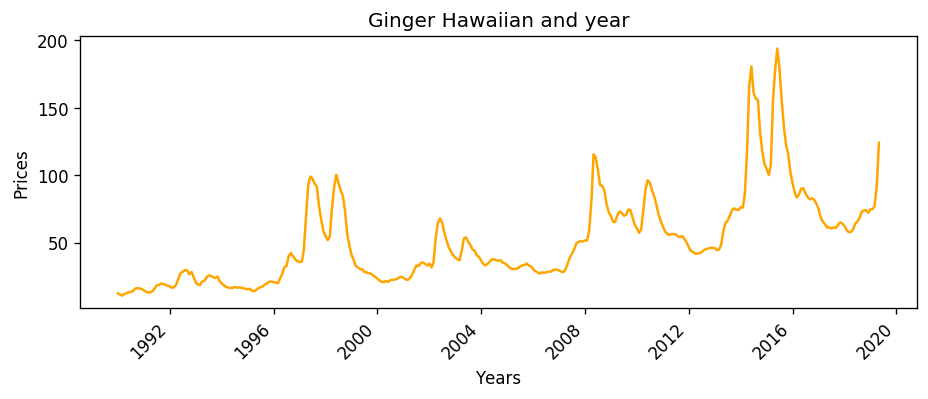

KeyboardInterrupt: 

In [84]:
geofiles = [f for f in listdir(geofolder) if isfile(join(geofolder, f))]
national_cpi =[]
for x in geofiles:
    if 'mean' in x:
        national_cpi.append(x)
        
        
def histo_graph():
    for file in national_cpi:
        province = pd.read_csv(DSDATA / 'FOOD_BY_GEO' / file , encoding = "ISO-8859-1")
        display(province)
        #province = normaliser(province)
    #hist = province.hist(bins=10000,histtype='step')
        num_bins = 24
        for x in range(province.shape[0]):
            province =province[province.columns.drop(list(province.filter(regex='Annual')))]
            n, bins, patches = plt.hist(province.iloc[x,2:].astype(float), num_bins, facecolor='blue', alpha=0.5)
            plt.xlabel('price')
            plt.ylabel('frequency')
            plt.title( province.iloc[x,1] +' distribution')
            plt.show()
           
            years = pd.to_datetime(pd.Series(list(province.columns[2:])), format='%Y %B')
            plt.plot(years,province.iloc[x,2:], color='orange')
            plt.xlabel('Years')
            plt.ylabel('Prices')
            plt.xticks(rotation=45, ha='right')
            plt.title( province.iloc[x,1]+' and year')
            plt.show()

histo_graph()   

# Half processed
- cpi was used to the food prices 
- null values are present
- Output: Histogram and Line graph(x-axis:years y-axis:prices)

national_CROPS_HALF.csv
39


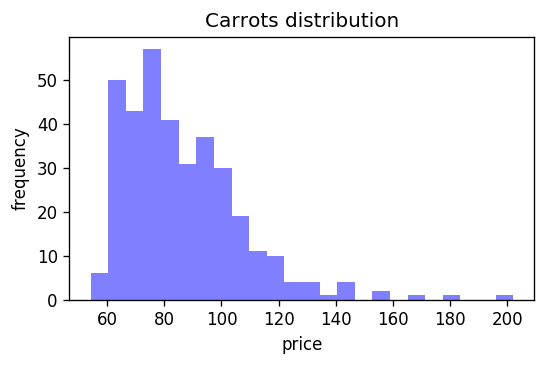

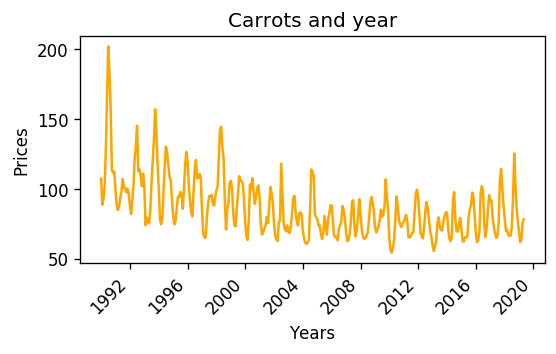

0 	 | The series is stationary


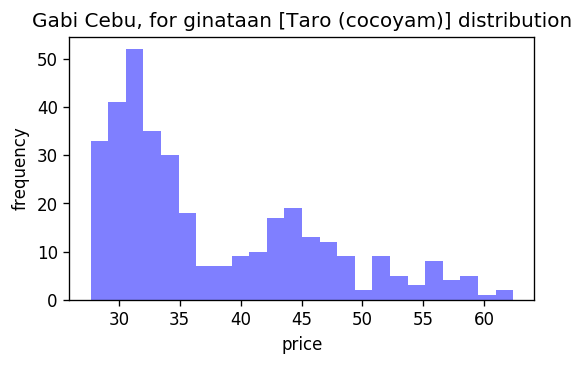

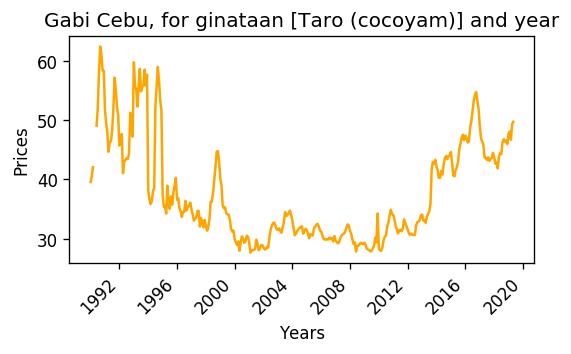

1 	 | The series is not stationary


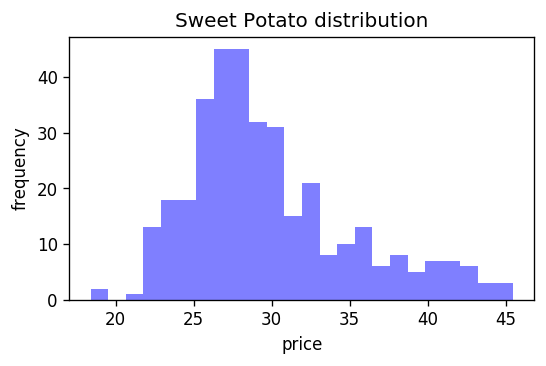

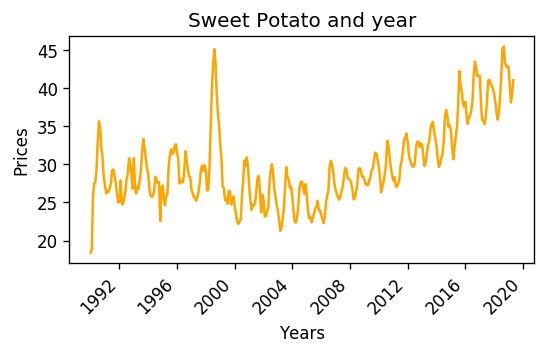

2 	 | The series is not stationary


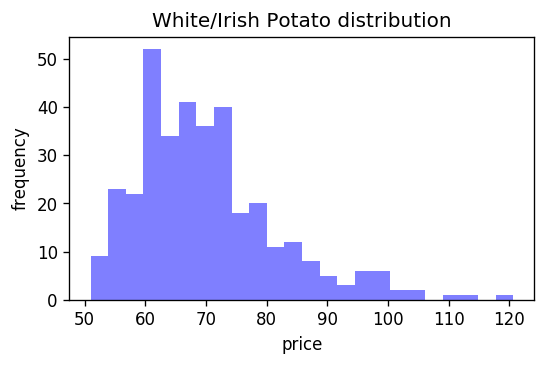

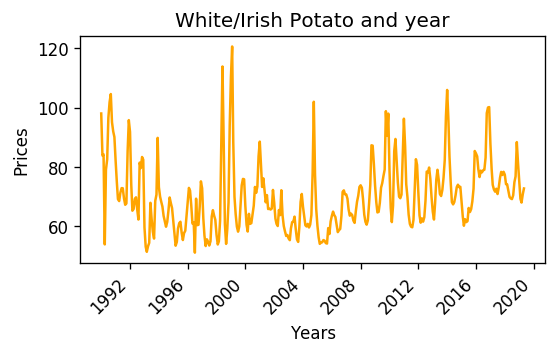

3 	 | The series is stationary


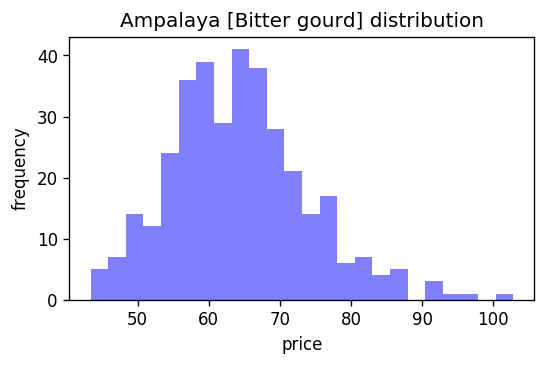

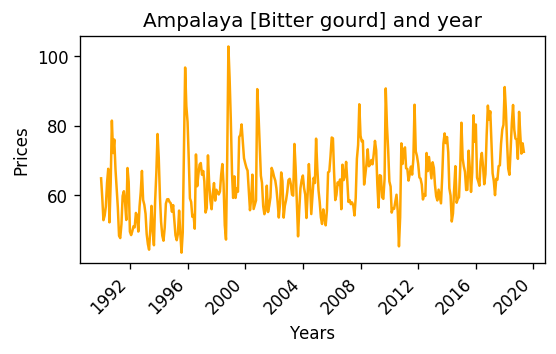

4 	 | The series is not stationary


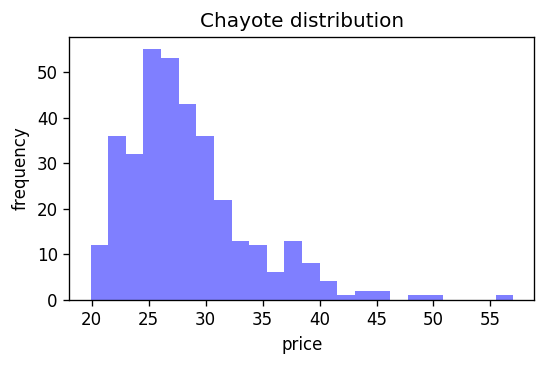

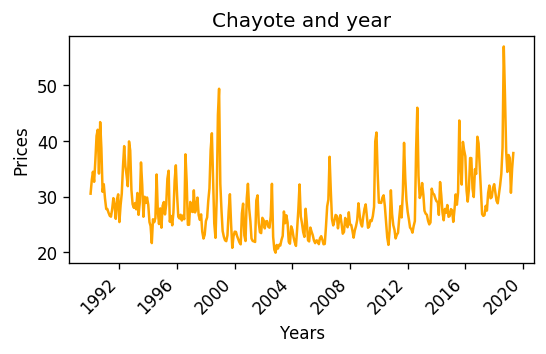

5 	 | The series is stationary


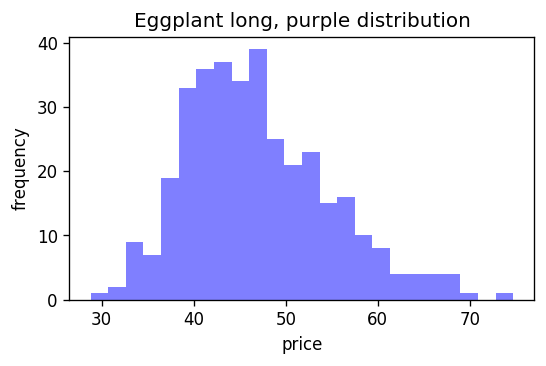

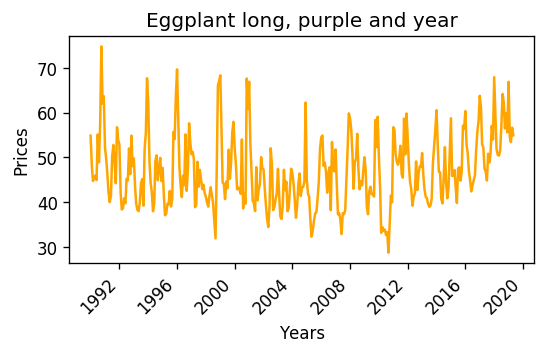

6 	 | The series is stationary


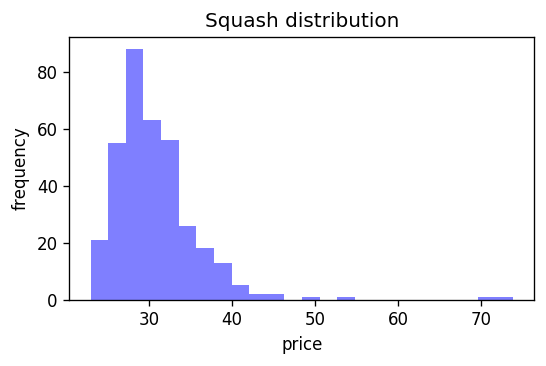

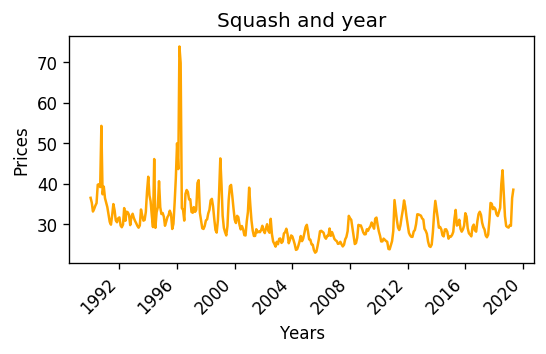

7 	 | The series is stationary


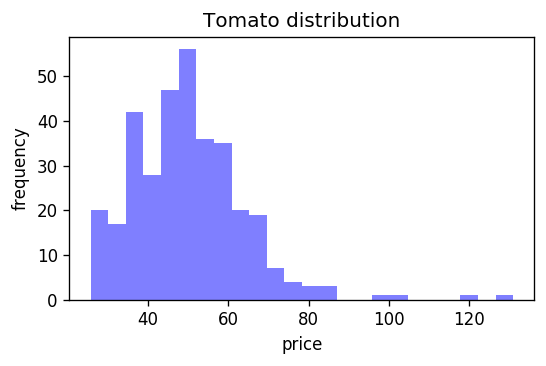

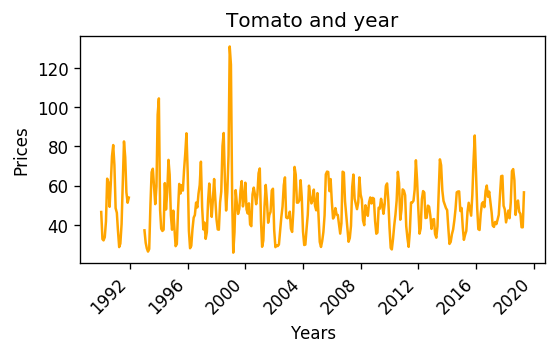

8 	 | The series is stationary


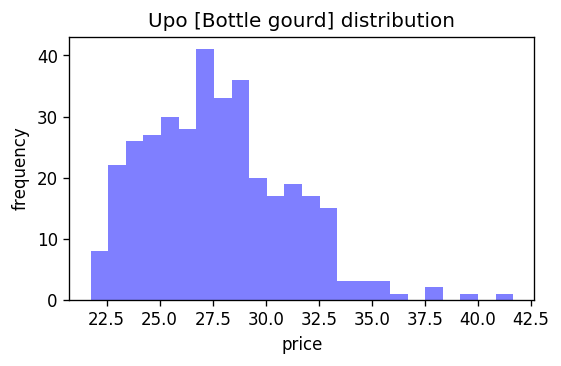

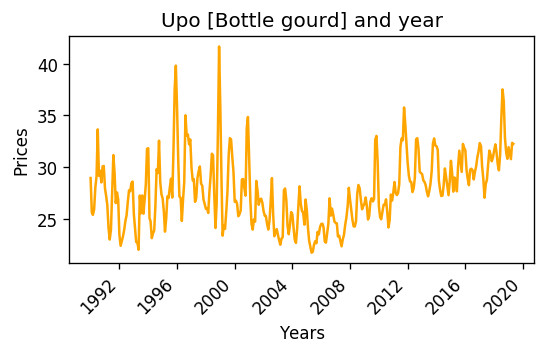

9 	 | The series is not stationary


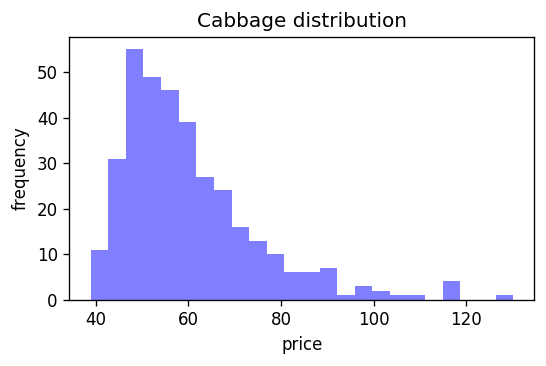

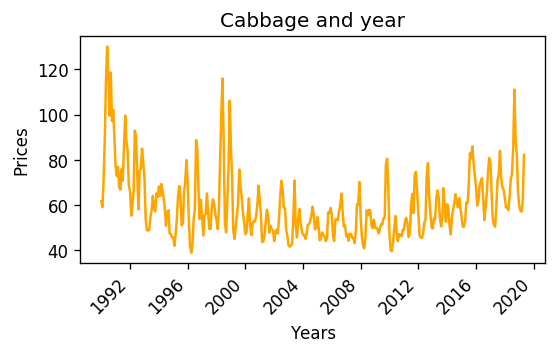

10 	 | The series is stationary


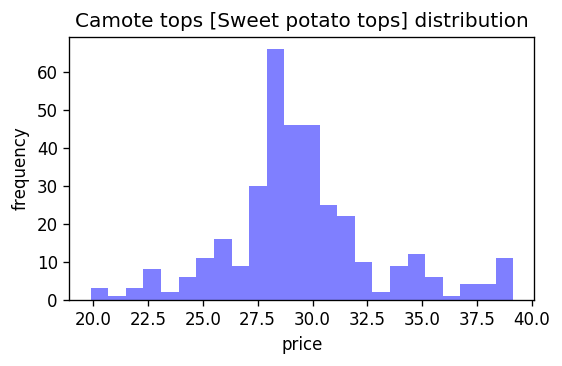

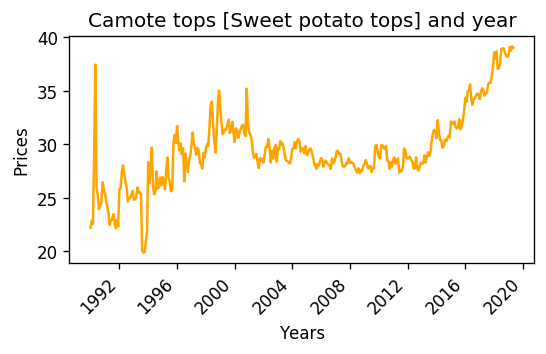

11 	 | The series is not stationary


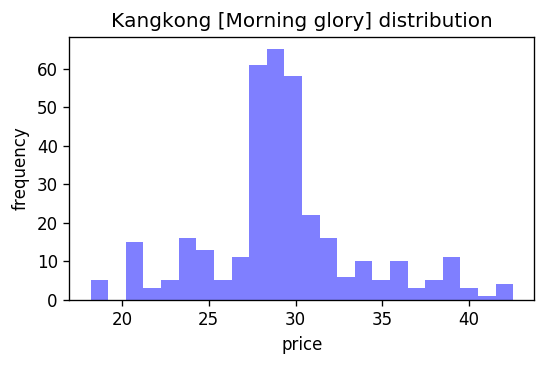

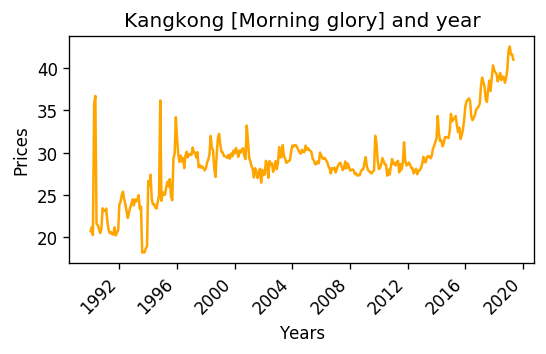

12 	 | The series is not stationary


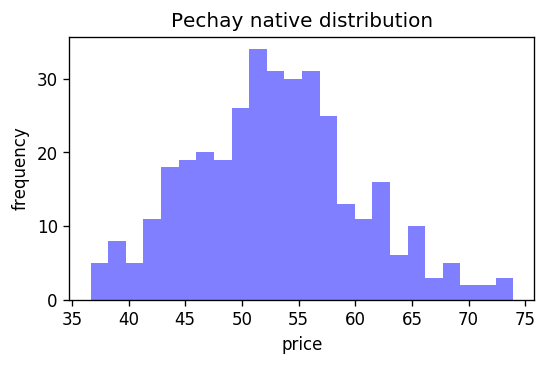

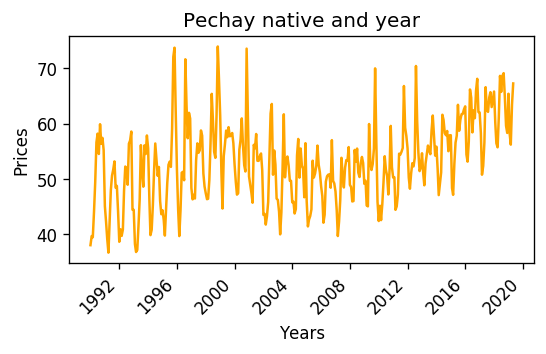

13 	 | The series is not stationary


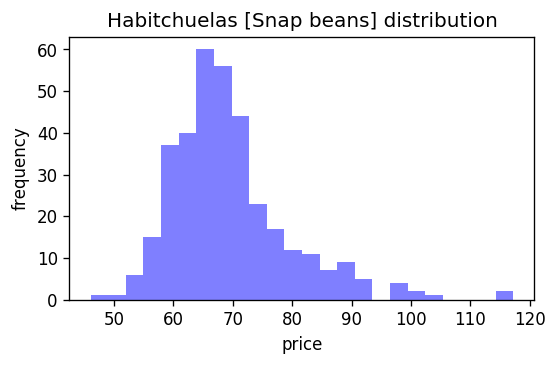

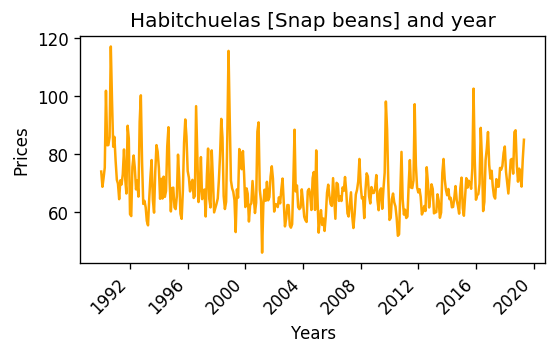

14 	 | The series is stationary


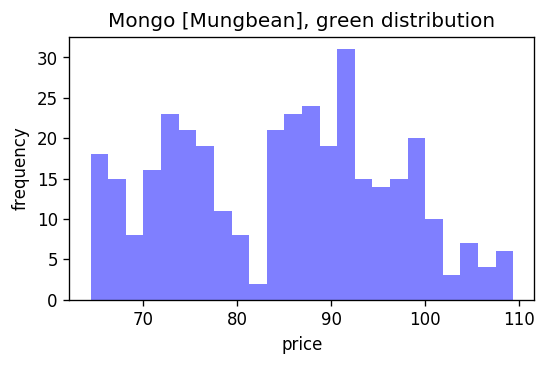

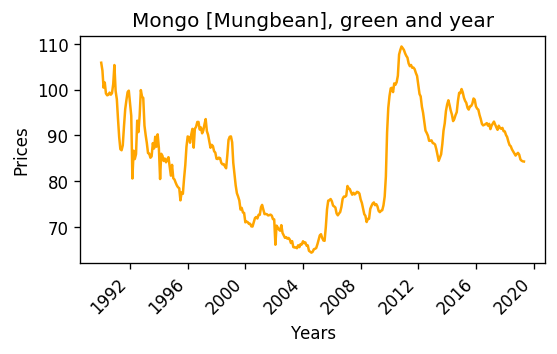

15 	 | The series is not stationary


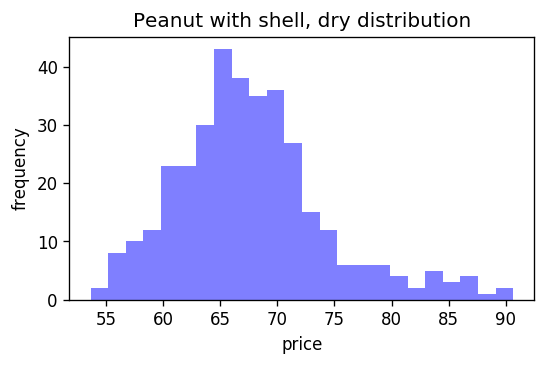

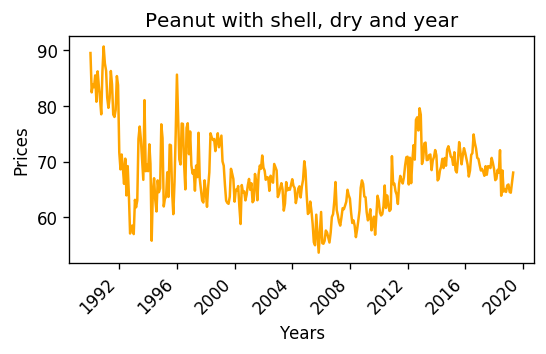

16 	 | The series is stationary


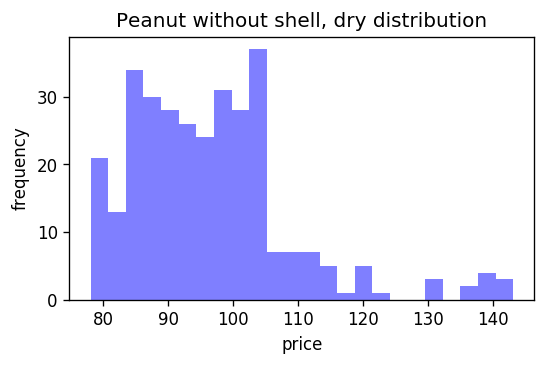

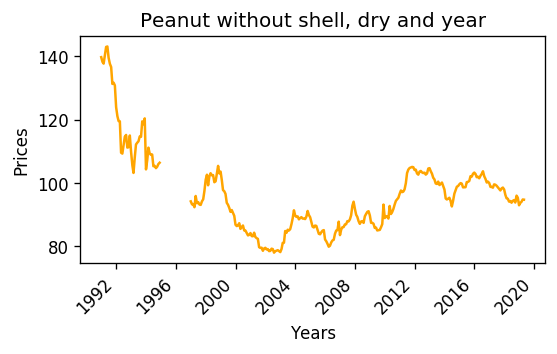

17 	 | The series is not stationary


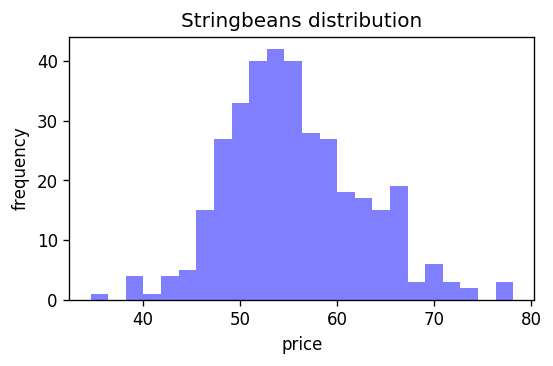

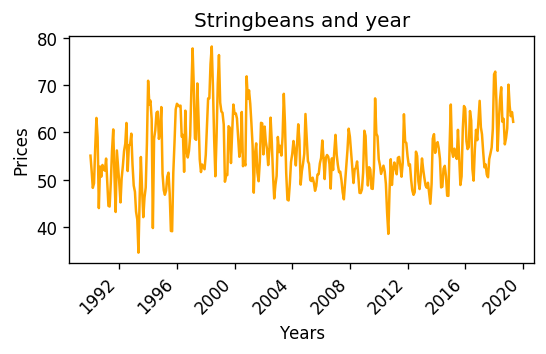

18 	 | The series is stationary


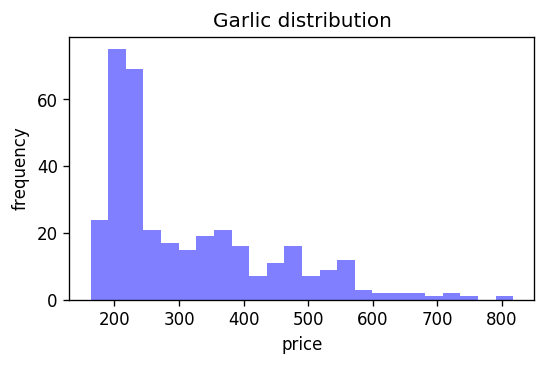

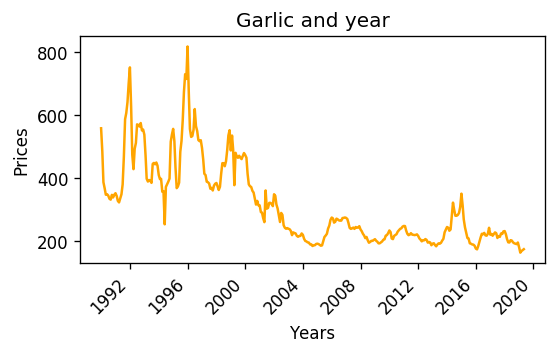

19 	 | The series is not stationary


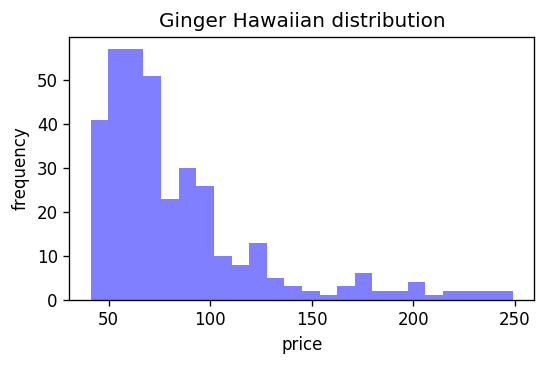

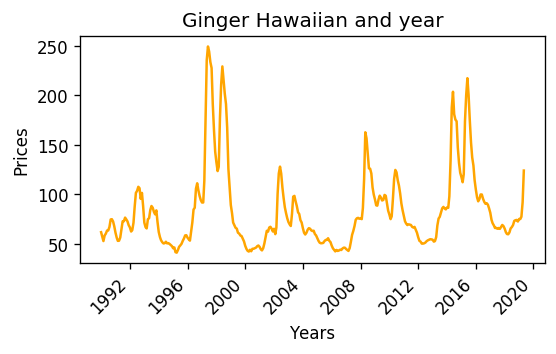

20 	 | The series is stationary


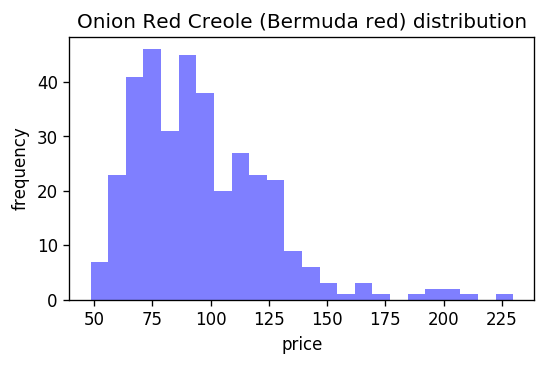

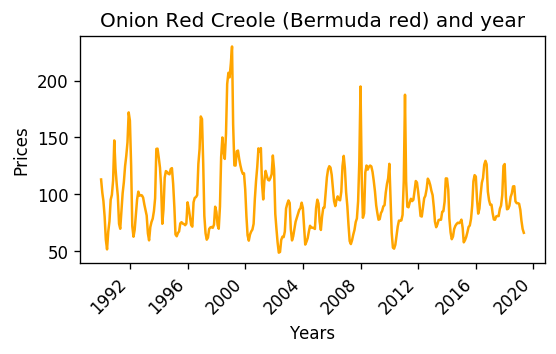

21 	 | The series is stationary


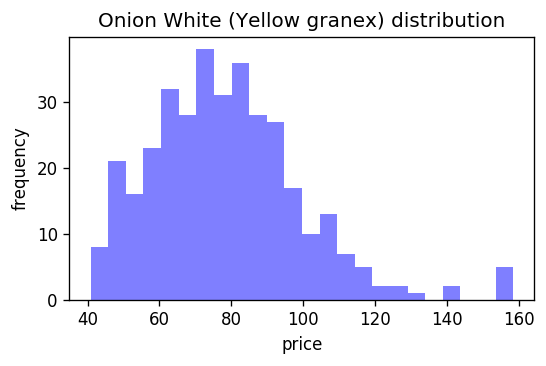

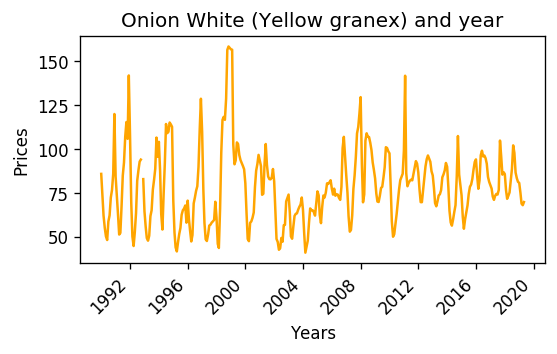

22 	 | The series is stationary


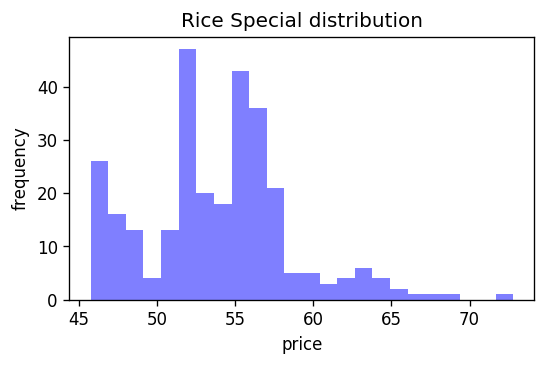

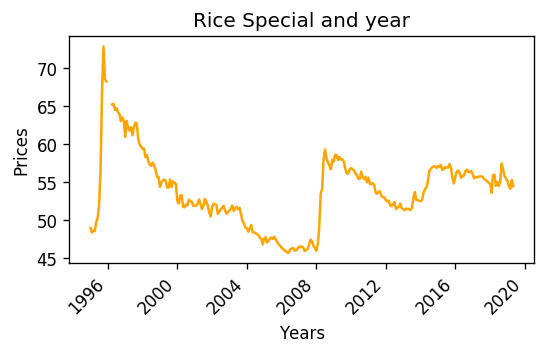

23 	 | The series is stationary


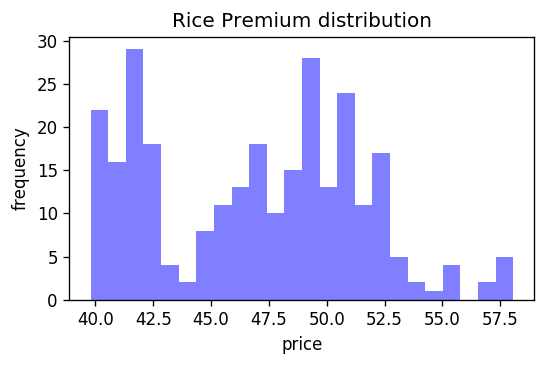

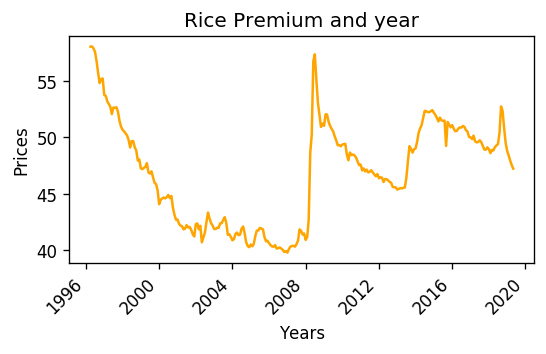

24 	 | The series is not stationary


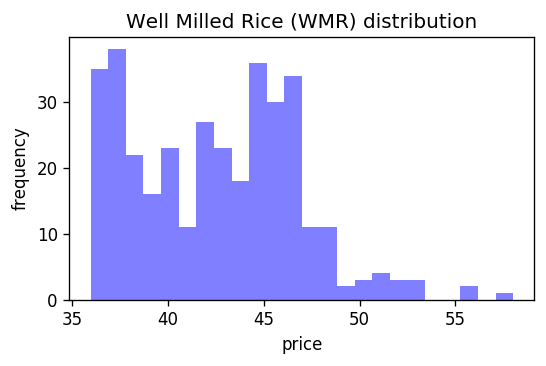

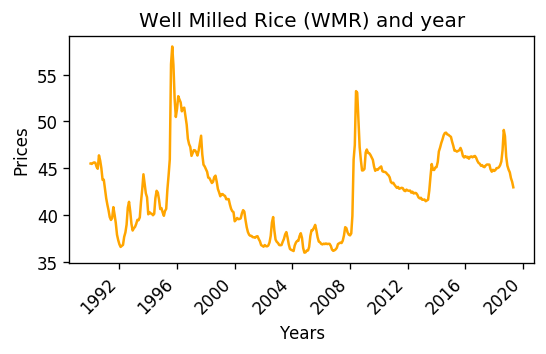

25 	 | The series is not stationary


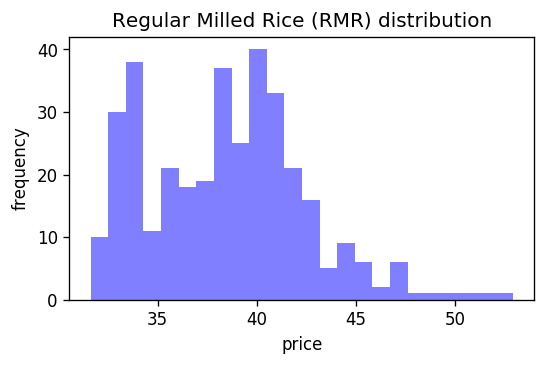

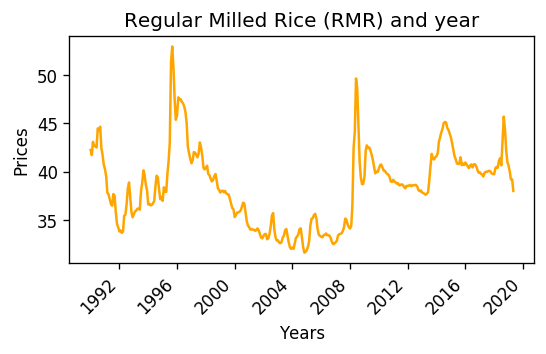

26 	 | The series is stationary


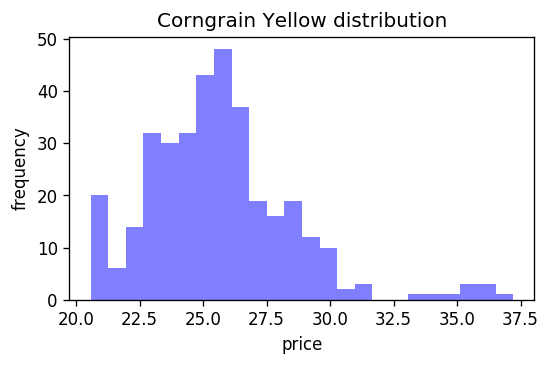

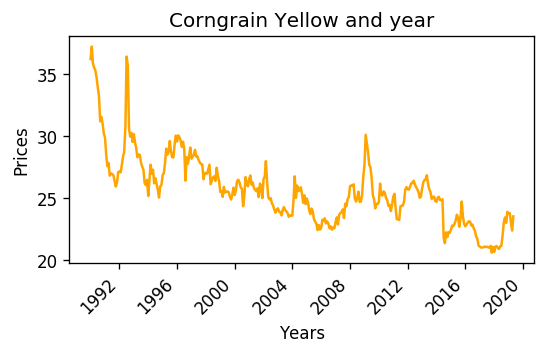

27 	 | The series is stationary


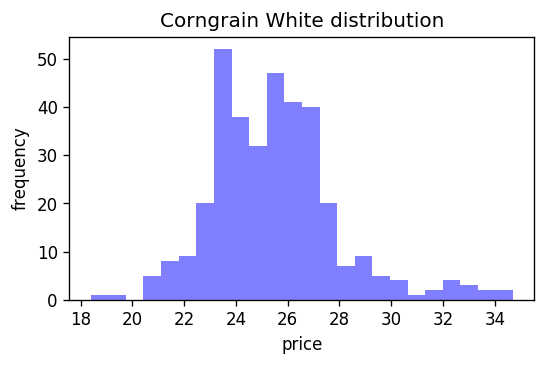

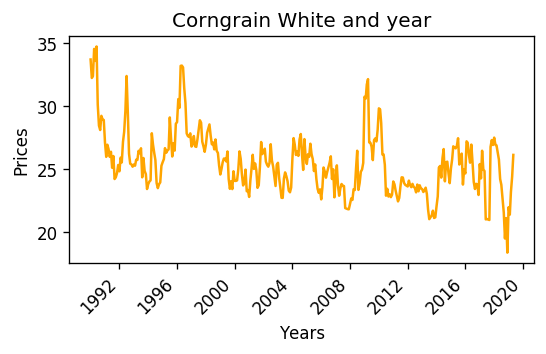

28 	 | The series is stationary


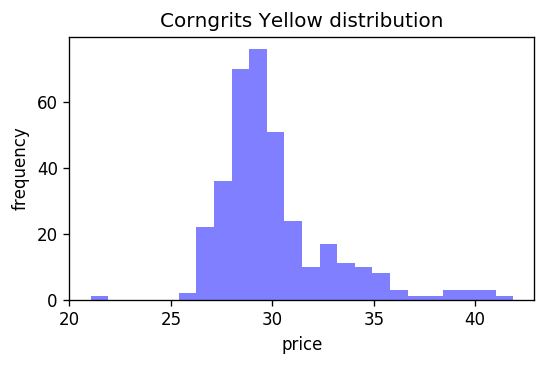

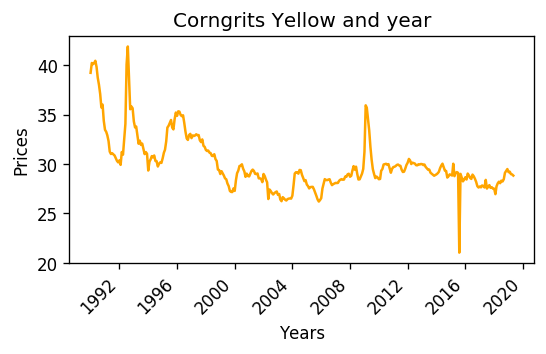

29 	 | The series is stationary


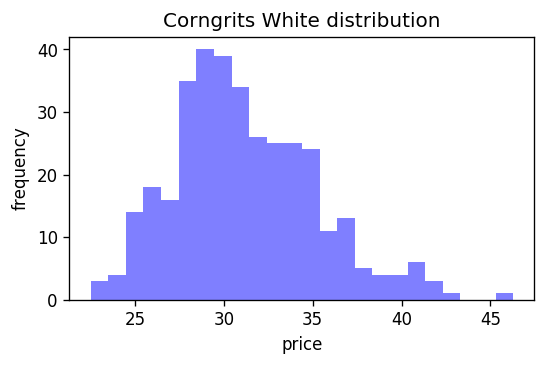

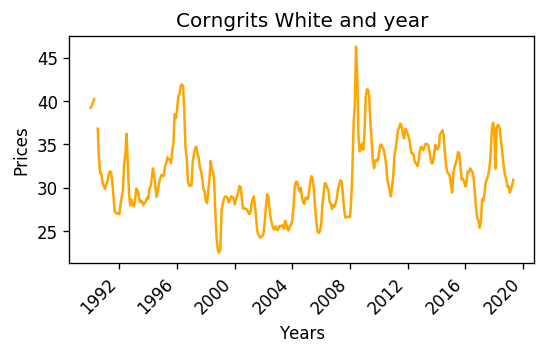

30 	 | The series is stationary


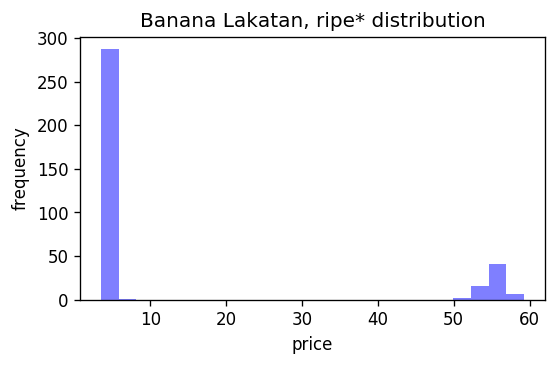

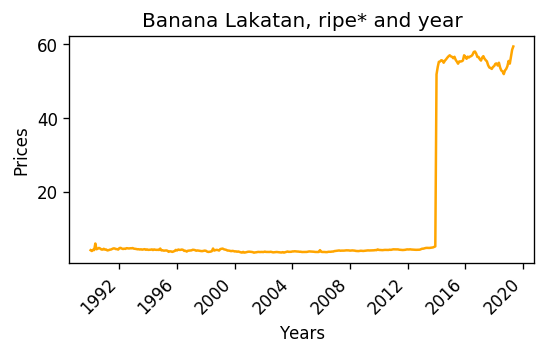

31 	 | The series is not stationary


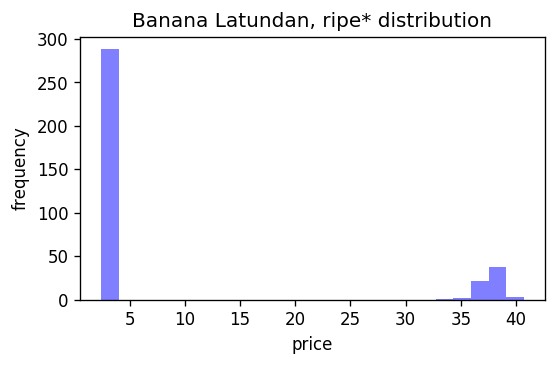

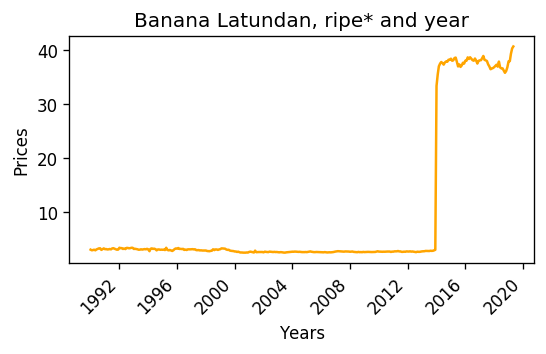

32 	 | The series is not stationary


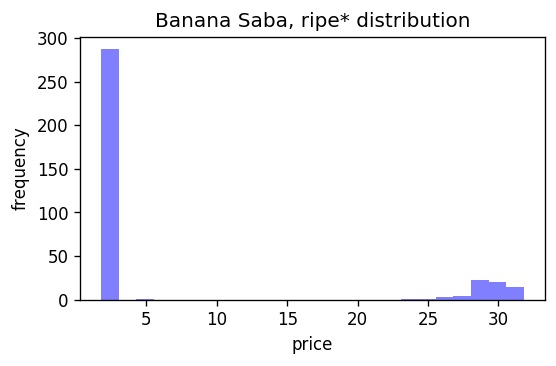

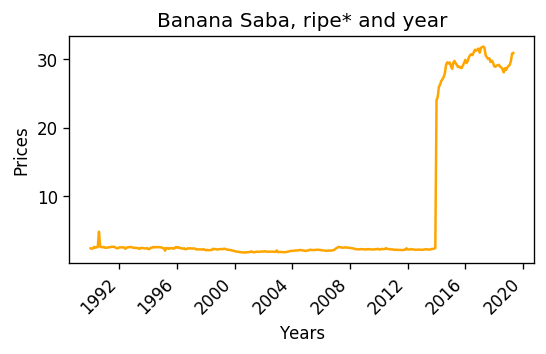

33 	 | The series is not stationary


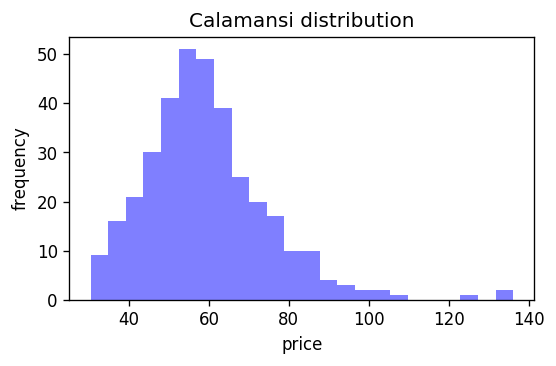

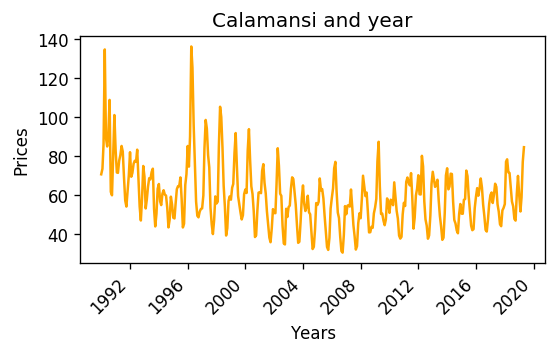

34 	 | The series is stationary


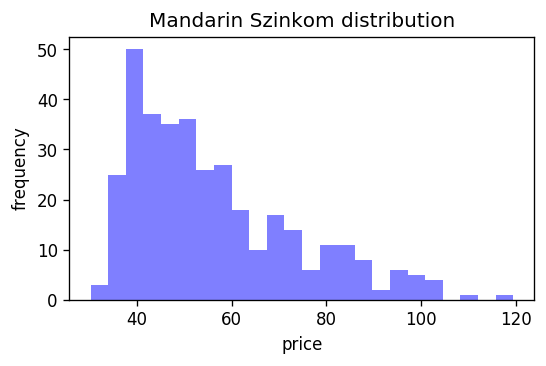

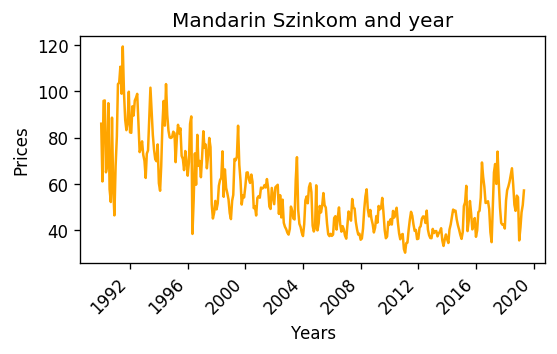

35 	 | The series is not stationary


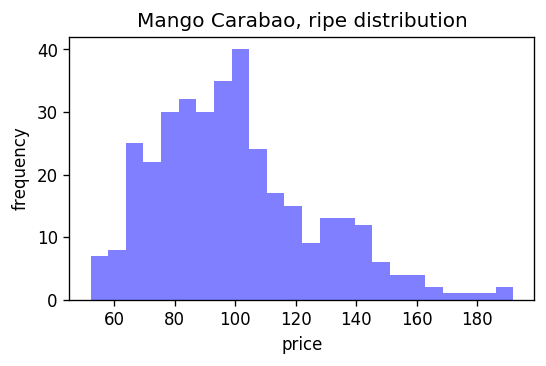

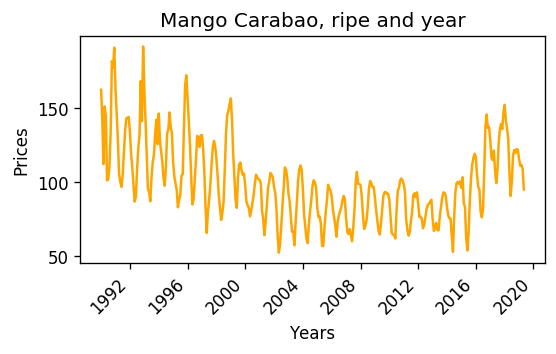

36 	 | The series is not stationary


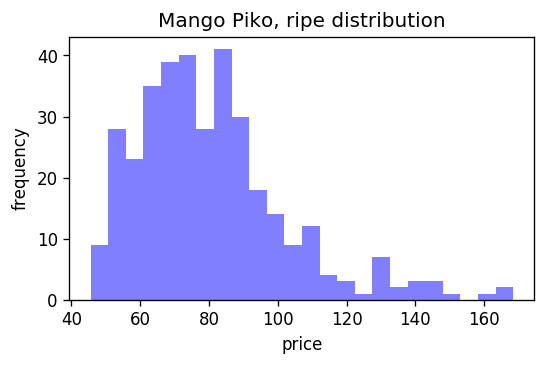

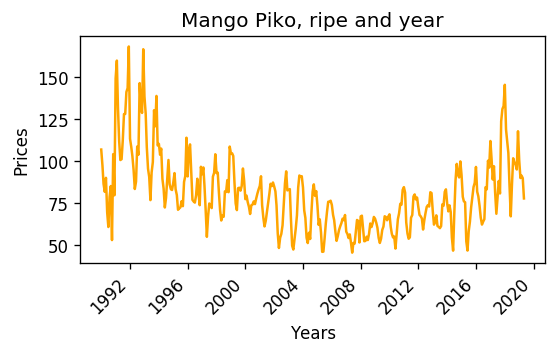

37 	 | The series is not stationary


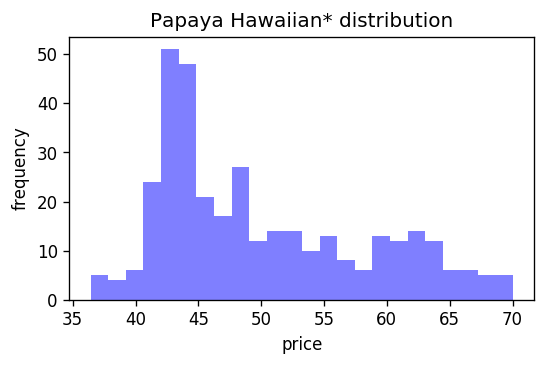

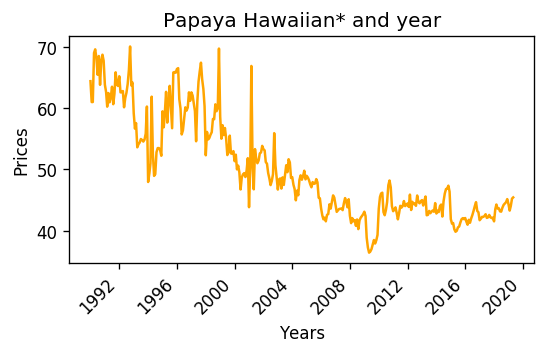

38 	 | The series is not stationary


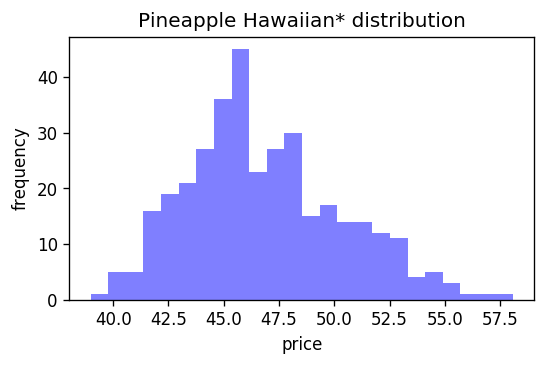

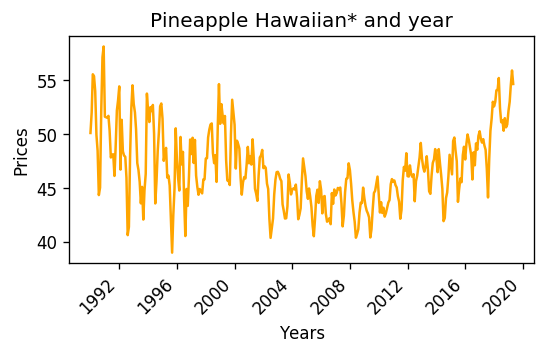

39 	 | The series is not stationary
national_POULTRY_HALF.csv
3


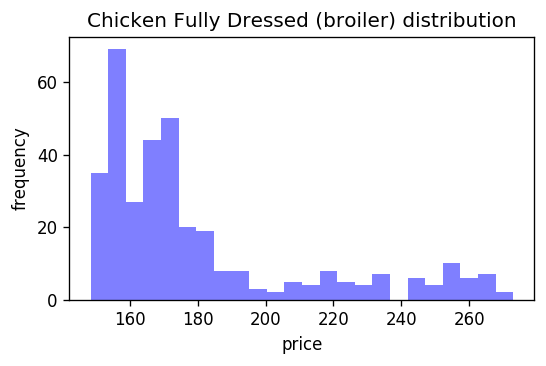

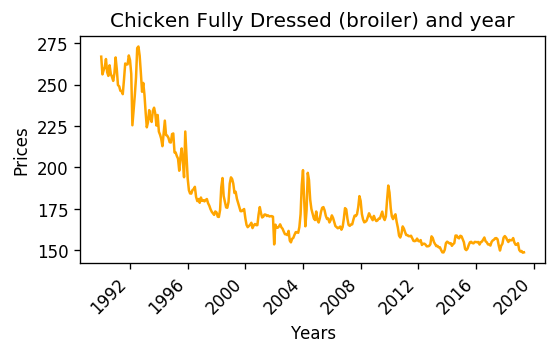

0 	 | The series is not stationary


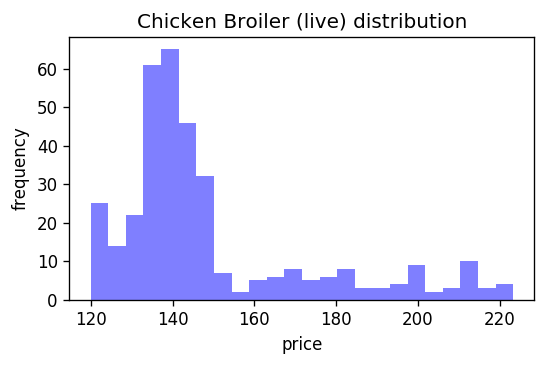

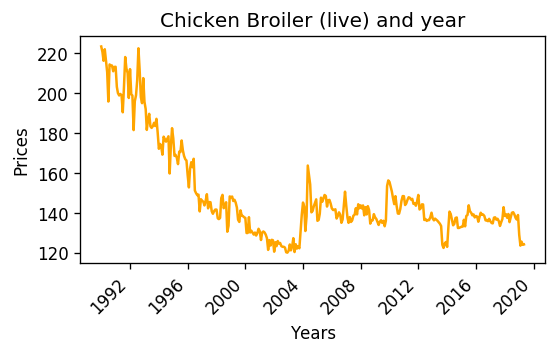

1 	 | The series is stationary


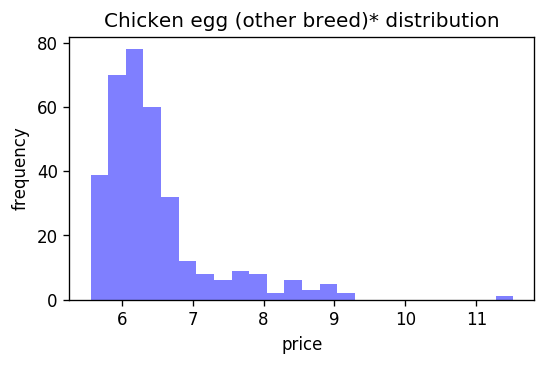

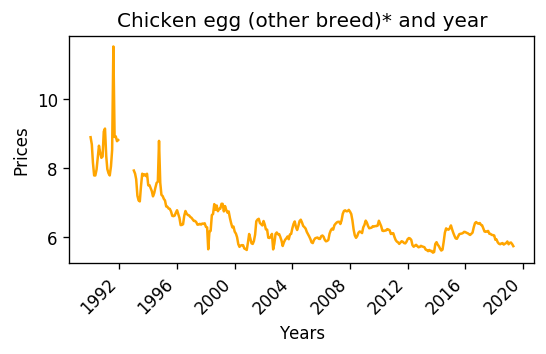

2 	 | The series is stationary


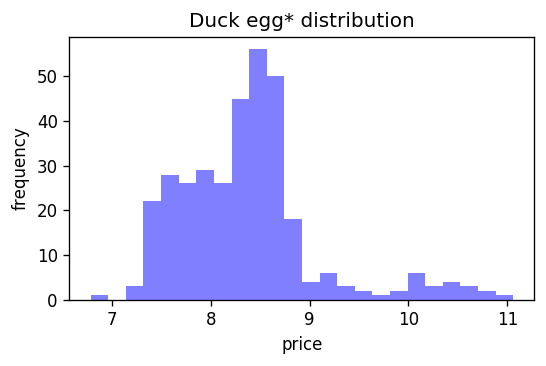

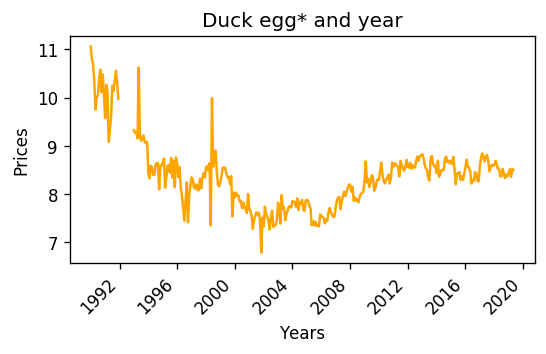

3 	 | The series is stationary
national_Beef_HALF.csv
4


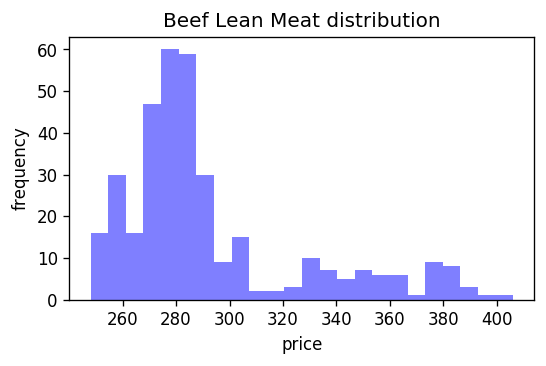

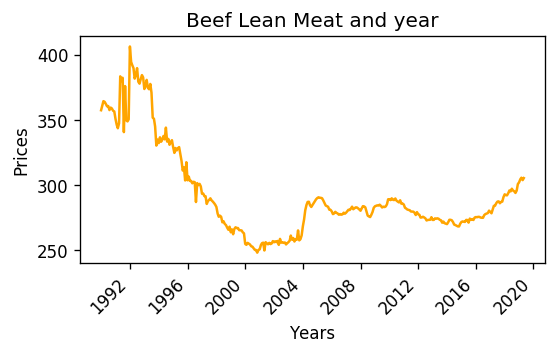

0 	 | The series is not stationary


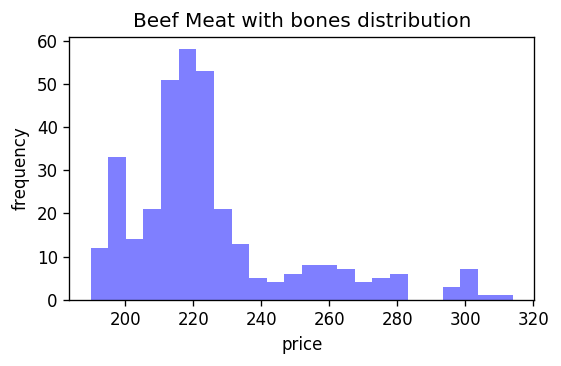

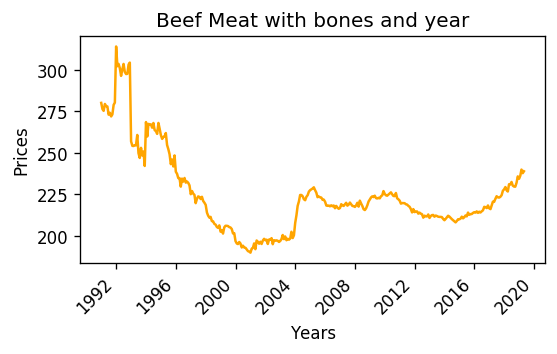

1 	 | The series is stationary


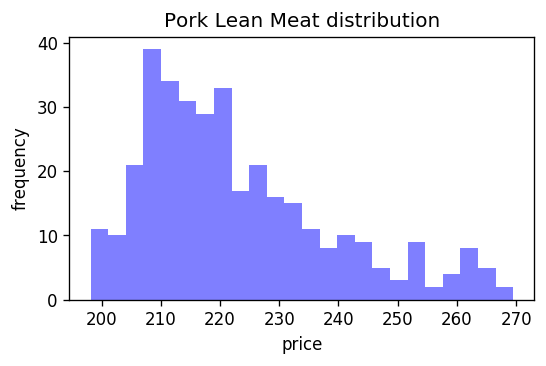

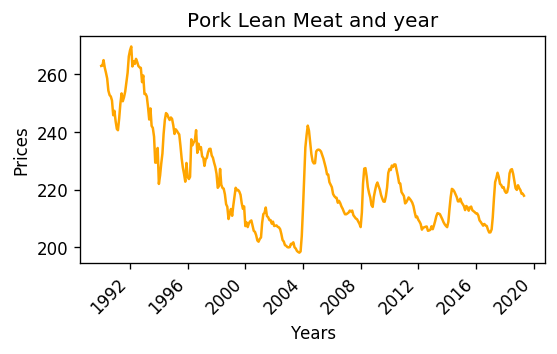

2 	 | The series is not stationary


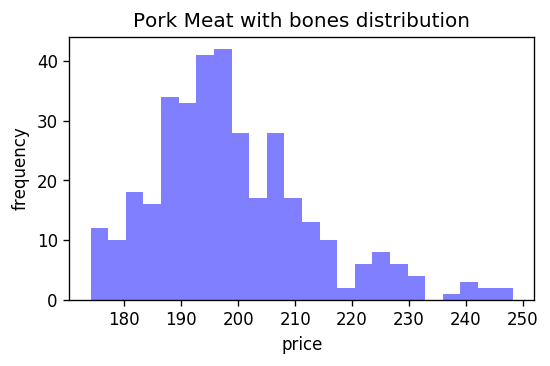

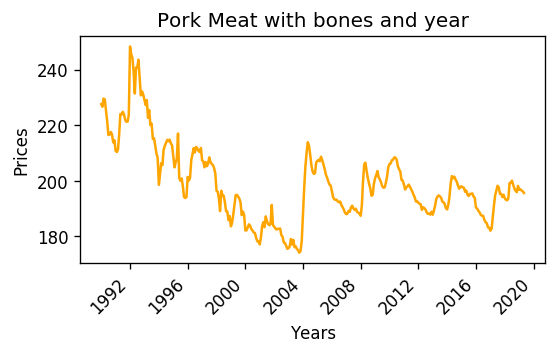

3 	 | The series is not stationary


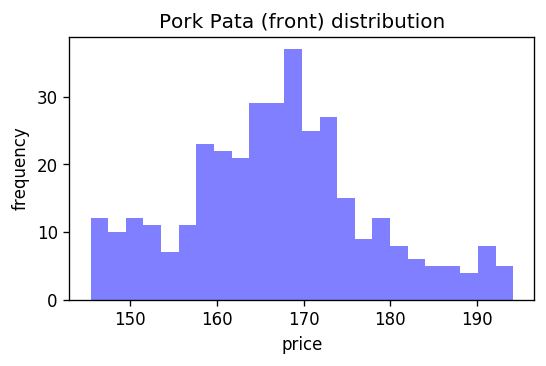

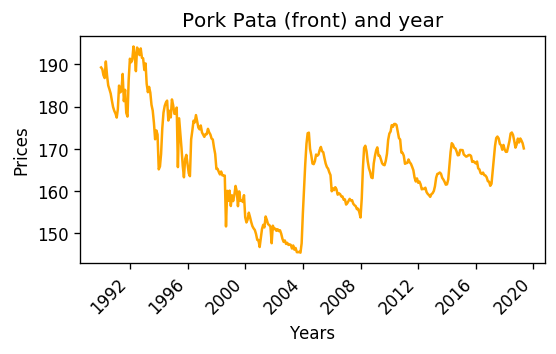

4 	 | The series is not stationary
national_SEAFOOD_HALF.csv
11


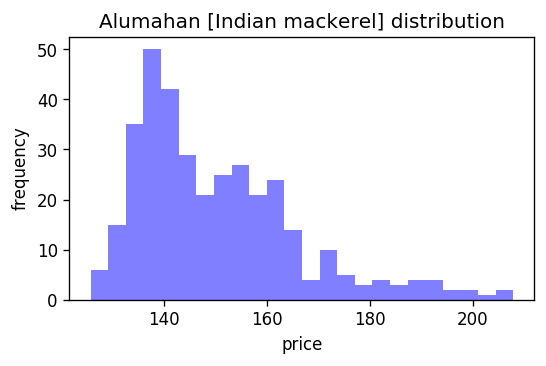

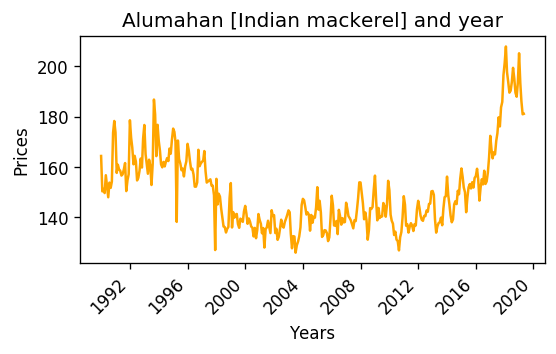

0 	 | The series is not stationary


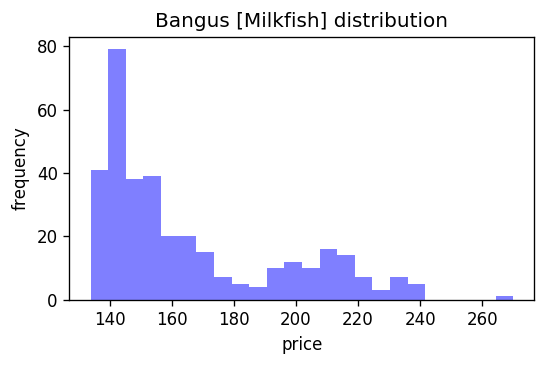

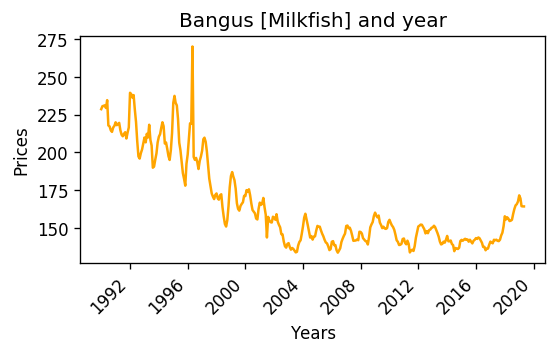

1 	 | The series is not stationary


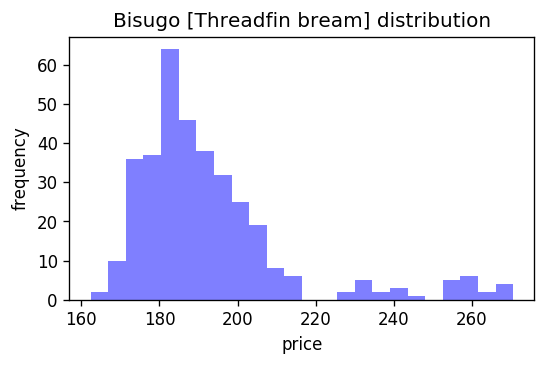

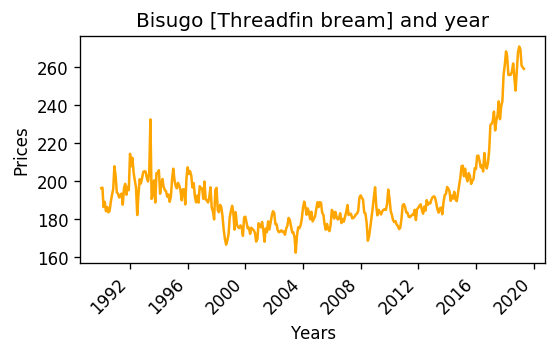

2 	 | The series is not stationary


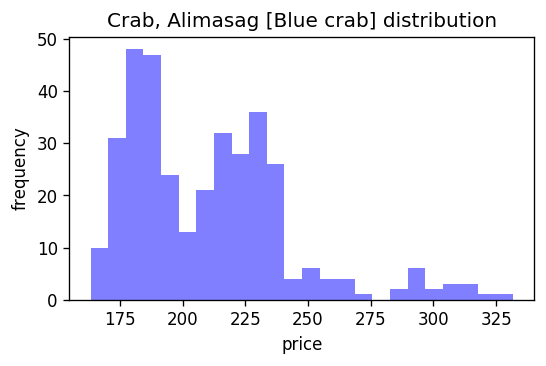

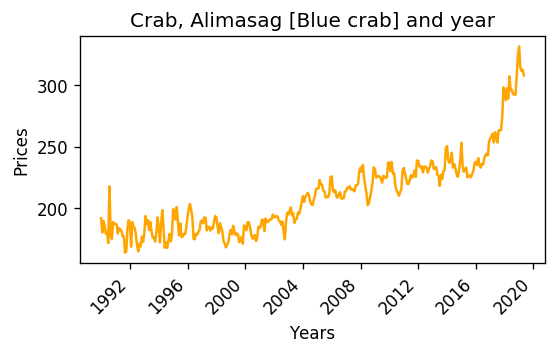

3 	 | The series is not stationary


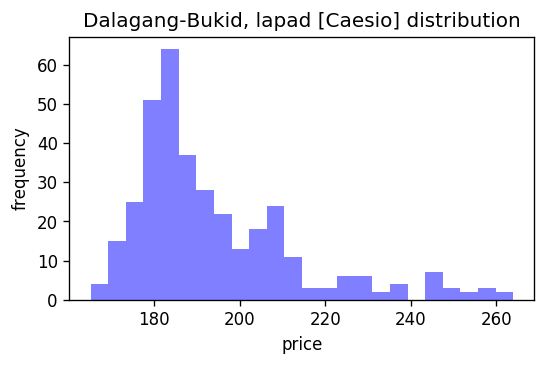

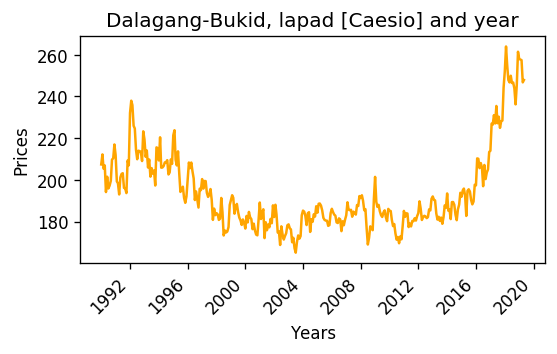

4 	 | The series is not stationary


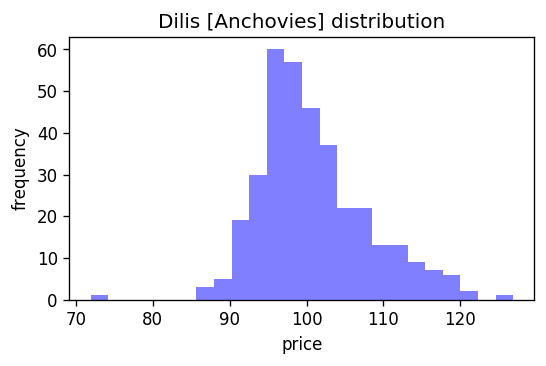

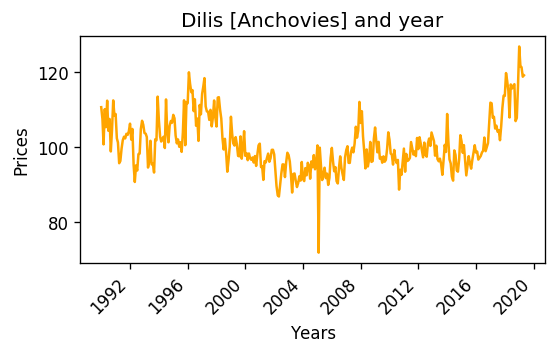

5 	 | The series is not stationary


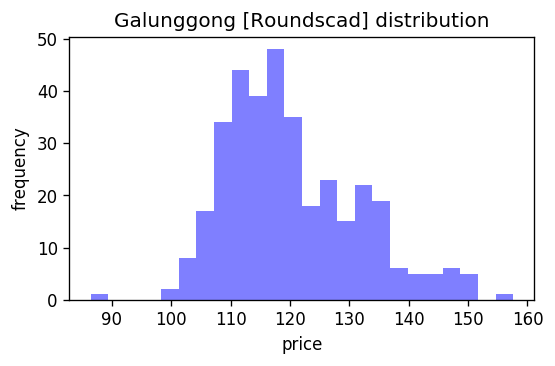

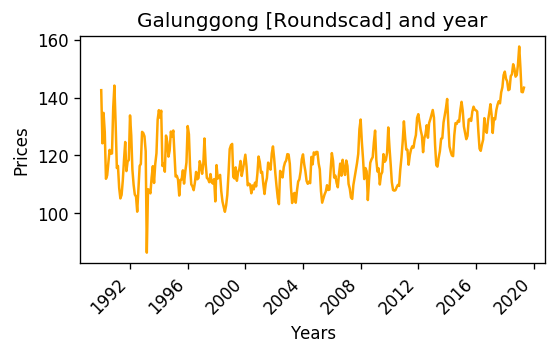

6 	 | The series is not stationary


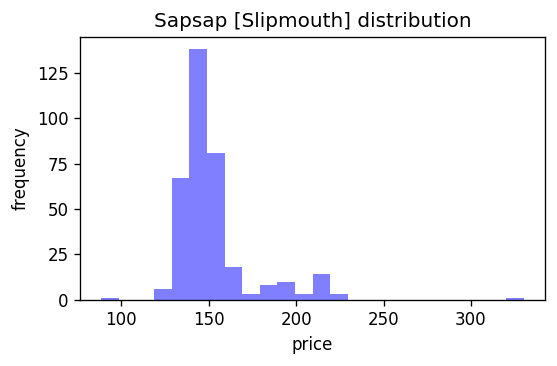

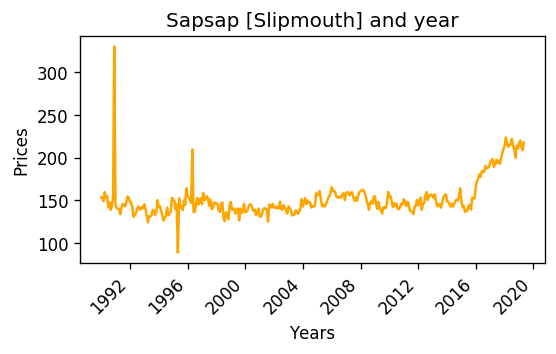

7 	 | The series is not stationary


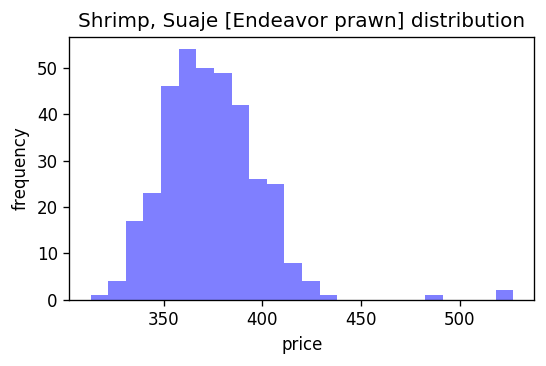

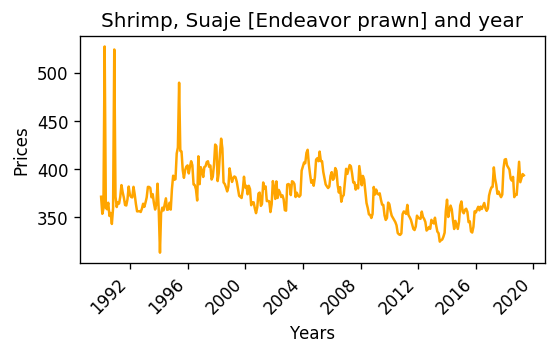

8 	 | The series is not stationary


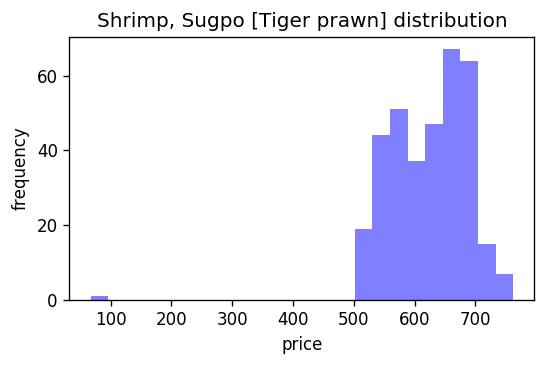

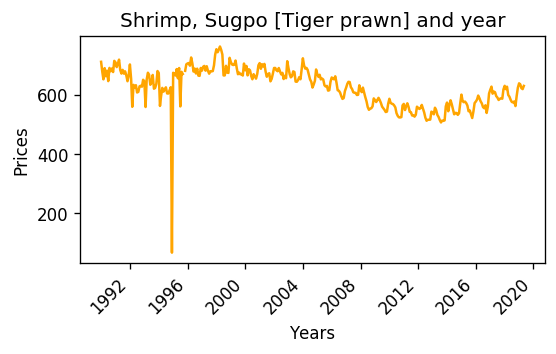

9 	 | The series is not stationary


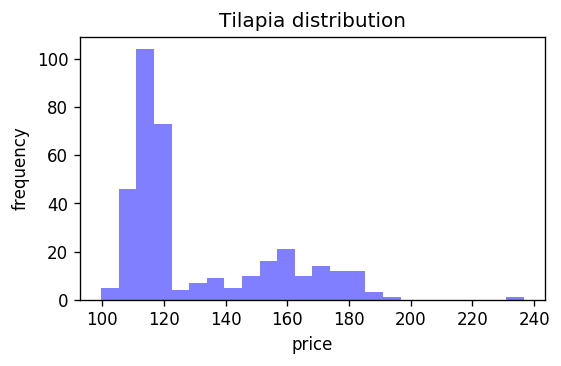

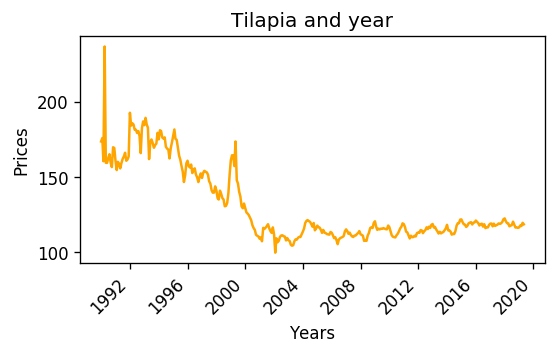

10 	 | The series is not stationary


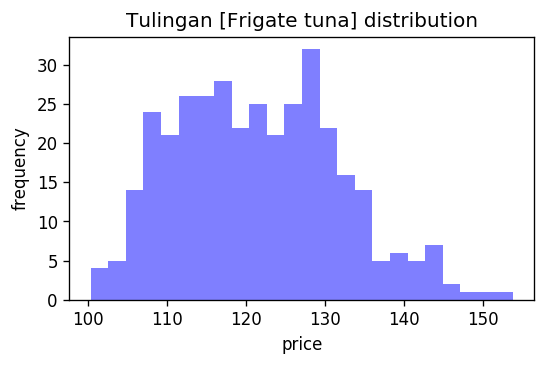

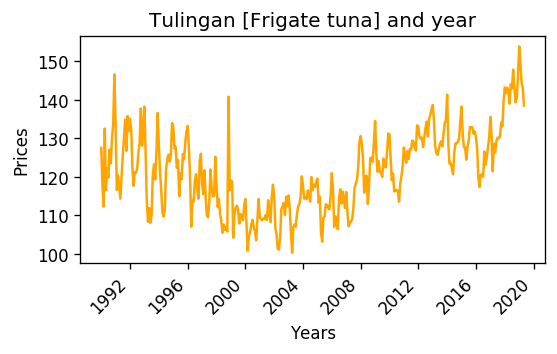

11 	 | The series is not stationary


In [137]:
from pylab import rcParams

rcParams['figure.figsize'] = 5, 3
stationary = [] 
n_stationary = []


for file in half_files:
    print(file)
    data = pd.read_csv(DSDATA / 'HALF_PROC' / file , encoding = "ISO-8859-1")
    print(data.shape[0]-1)
    num_bins = 24
    for x in range(data.shape[0]):
        data =data[data.columns.drop(list(data.filter(regex='Annual')))]
        n, bins, patches = plt.hist(data.iloc[x,2:].astype(float), num_bins, facecolor='blue', alpha=0.5)
        plt.xlabel('price')
        plt.ylabel('frequency')
        plt.title( data.iloc[x,1] +' distribution')
        pic_name = data.iloc[x,1]
        pic_name = pic_name.replace("\\"," ")
        pic_name = pic_name.replace("/"," ")
        pic_name = pic_name.replace("["," ")
        pic_name = pic_name.replace("]"," ")
        plt.gcf().subplots_adjust(bottom=0.15)
        plt.savefig("pics/" + pic_name +"_dist.png", dpi=150)
        plt.show()        
        years = pd.to_datetime(pd.Series(list(data.columns[2:])), format='%Y %B')
        plt.plot(years,data.iloc[x,2:], color='orange')
        plt.xlabel('Years')
        plt.ylabel('Prices')
        plt.xticks(rotation=45, ha='right')
        plt.title( data.iloc[x,1]+' and year')
        plt.gcf().subplots_adjust(bottom=0.25)
        plt.savefig("pics/" + pic_name+"_price.png",  dpi=150)
        plt.show()
        
        if test_stationarity(data.iloc[x,2:].dropna()):
            stationary.append(data.iloc[x,1])
        else:
            n_stationary.append(data.iloc[x,1])
       

In [ ]:
print("stationary:")
print(stationary)
print("not stationary:")
print(n_stationary )

In [ ]:
half_files

# Machine learning
- ARIMA model to predict CPI
- AR: Autoregression. A model that uses the dependent relationship between an observation and some number of lagged observations.
- I: Integrated. The use of differencing of raw observations (e.g. subtracting an observation from an observation at the previous time step) in order to make the time series stationary.
- MA: Moving Average. A model that uses the dependency between an observation and a residual error from a moving average model applied to lagged observations.
## parameters
    - p: The number of lag observations included in the model, also called the lag order.
    - d: The number of times that the raw observations are differenced, also called the degree of differencing.
    - q: The size of the moving average window, also called the order of moving average.
    - source: https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/
    - source: https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/

# ADF test
- P-value more than significance value(0.05)
- Null Hypothesis: the dataset is not stationary
- Alternative Hypothesis: the dataset is stationary
- We accept the null hypothesis that data is not stationary
- conclusion: There is a need for **differencing** (d=1)

In [86]:
df1= pd.read_excel(open(cpifolder/"prices2012.xls","rb"), sheet_name='PH',skiprows =2)

df2 =pd.DataFrame()
df2['value'] = df1['All Items']
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(df2.value.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])



ADF Statistic: 3.113074
p-value: 1.000000


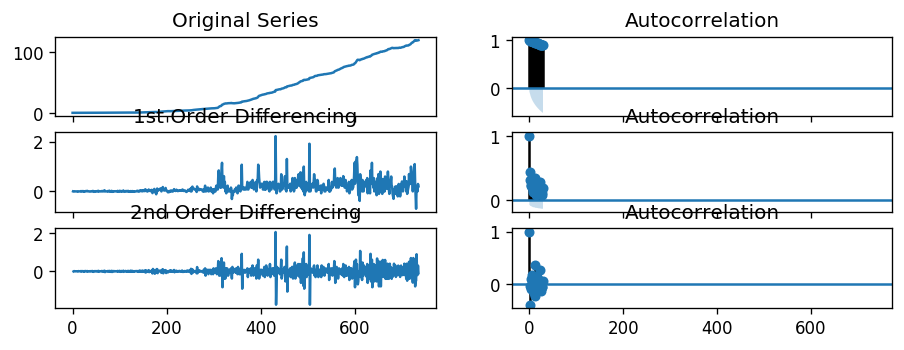

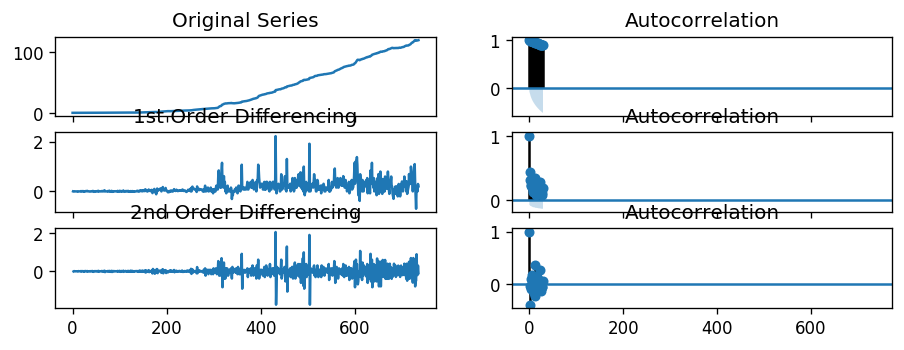

In [87]:
# Import data
import numpy as np, pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Original Series
fig, axes = plt.subplots(3, 2, sharex=True)
axes[0, 0].plot(df2.value); axes[0, 0].set_title('Original Series')
plot_acf(df2.value, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df2.value.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(df2.value.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df2.value.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df2.value.diff().diff().dropna(), ax=axes[2, 1])

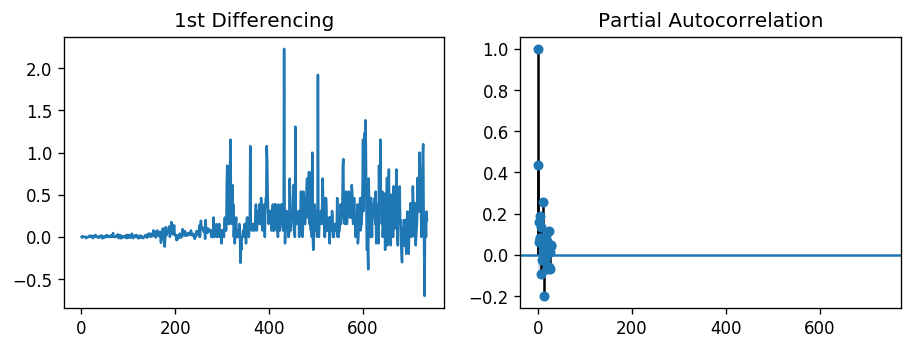

In [88]:
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(df2.value.diff()); axes[0].set_title('1st Differencing')
#axes[1].set(ylim=(0,5))
plot_pacf(df2.value.diff().dropna(), ax=axes[1])

plt.show()

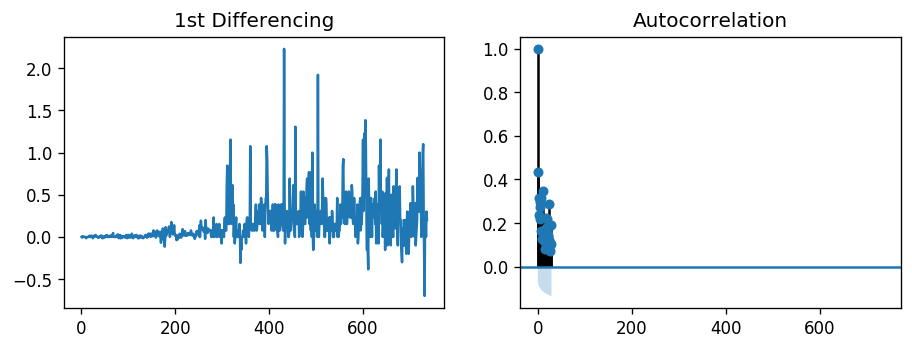

In [89]:
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})



fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(df2.value.diff()); axes[0].set_title('1st Differencing')
#axes[1].set(ylim=(0,1.5))
plot_acf(df2.value.diff().dropna(), ax=axes[1])

plt.show()

In [90]:
from statsmodels.tsa.stattools import acf

# Create Training and Test
train = df2.value[:626]
test = df2.value[626:]

                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  625
Model:                 ARIMA(1, 1, 1)   Log Likelihood                  89.821
Method:                       css-mle   S.D. of innovations              0.209
Date:                Wed, 21 Aug 2019   AIC                           -171.641
Time:                        20:09:34   BIC                           -153.890
Sample:                             1   HQIC                          -164.744
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.1457      0.033      4.439      0.000       0.081       0.210
ar.L1.D.value     0.9256      0.031     29.445      0.000       0.864       0.987
ma.L1.D.value    -0.7041      0.067    -

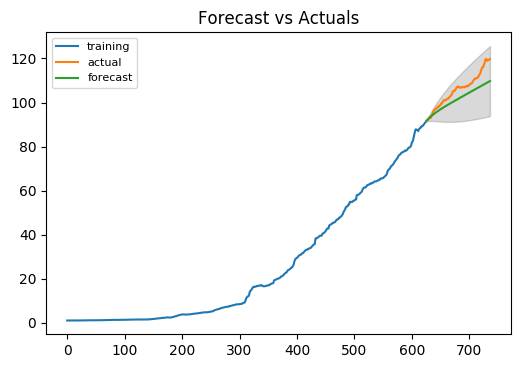

In [122]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(train, order=(1, 1, 1))  
fitted = model.fit(disp=-1)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(111, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)
# Plot
plt.figure(figsize=(6,4), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.savefig("ARIMA_MODEL.png")
plt.show()


In [92]:
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    acf1 = acf(fc-test)[1]                      # ACF1
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'acf1':acf1, 
            'corr':corr, 'minmax':minmax})

forecast_accuracy(fc, test.values)

/Users/macbookpro/Desktop/DLSU/9th_Term/DATASCI/venv/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


{'mape': 0.037906578065037375,
 'me': -4.125024743589925,
 'mae': 4.160595557609576,
 'mpe': -0.037522897576742174,
 'rmse': 4.946243370201701,
 'acf1': 0.9607610862186938,
 'corr': 0.9848429043060892,
 'minmax': 0.03790581174848828}

In [93]:
df1.columns

Index(['Year', 'Month', 'All Items', 'Food and Non-Alcoholic Beverages',
       'Alcoholic Beverages and Tobacco', 'Clothing and Footwear',
       'Housing, Water, Electricity,  Gas, and other Fuels',
       'Furnishing, Household Equipment and Routine Maintenance of the House',
       'Health', 'Transport', 'Communication', 'Recreation and Culture',
       'Education', 'Restaurants and Miscellaneous Goods and Services'],
      dtype='object')

In [94]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

#df = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/wwwusage.csv', names=['value'], header=0)

model = pm.auto_arima(df2.value, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Fit ARIMA: order=(1, 1, 1); AIC=-92.606, BIC=-74.201, Fit time=0.476 seconds
Fit ARIMA: order=(0, 1, 0); AIC=92.292, BIC=101.494, Fit time=0.015 seconds
Fit ARIMA: order=(1, 1, 0); AIC=-59.410, BIC=-45.606, Fit time=0.079 seconds
Fit ARIMA: order=(0, 1, 1); AIC=-14.213, BIC=-0.410, Fit time=0.069 seconds
Fit ARIMA: order=(2, 1, 1); AIC=-114.993, BIC=-91.987, Fit time=0.385 seconds
Fit ARIMA: order=(2, 1, 0); AIC=-76.152, BIC=-57.747, Fit time=0.155 seconds
Fit ARIMA: order=(2, 1, 2); AIC=-83.228, BIC=-55.620, Fit time=1.439 seconds
Fit ARIMA: order=(3, 1, 2); AIC=-118.942, BIC=-86.734, Fit time=1.265 seconds
Fit ARIMA: order=(3, 1, 1); AIC=-116.223, BIC=-88.616, Fit time=0.496 seconds
Fit ARIMA: order=(3, 1, 3); AIC=-97.583, BIC=-60.773, Fit time=4.620 seconds
Total fit time: 9.022 seconds
                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  736
Model:                 ARIMA(3, 1, 2)   L

                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  625
Model:                 ARIMA(2, 1, 0)   Log Likelihood                  79.497
Method:                       css-mle   S.D. of innovations              0.213
Date:                Wed, 21 Aug 2019   AIC                           -150.995
Time:                        17:53:13   BIC                           -133.244
Sample:                             1   HQIC                          -144.098
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.1451      0.019      7.810      0.000       0.109       0.181
ar.L1.D.value     0.3875      0.040      9.804      0.000       0.310       0.465
ar.L2.D.value     0.1549      0.040     

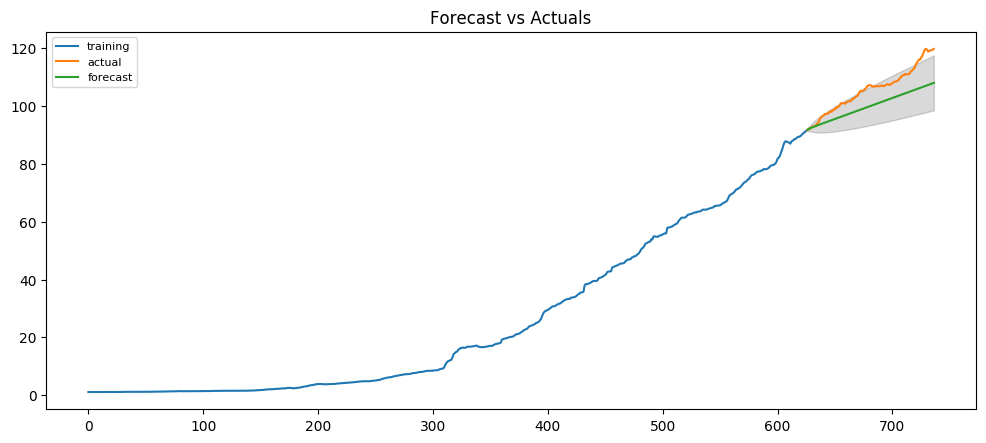

In [95]:
model = ARIMA(train, order=(2, 1, 0))  
fitted = model.fit(disp=-1)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(111, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [96]:
forecast_accuracy(fc, test.values)

/Users/macbookpro/Desktop/DLSU/9th_Term/DATASCI/venv/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:541: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(msg, FutureWarning)


{'mape': 0.051070320998770485,
 'me': -5.5643243779628,
 'mae': 5.571711754889461,
 'mpe': -0.05099023841109882,
 'rmse': 6.3323440222639515,
 'acf1': 0.9593109203265913,
 'corr': 0.9840395496606842,
 'minmax': 0.05107027450267754}